In [1]:
!pip install slycot
!pip install control
!pip install pymannkendall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 21.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for slycot: filename=slycot-0.6.0-cp310-cp310-linux_x86_64.whl size=2020821 sha256=85931a18a169d418dfd0ccad3a1f889a28f072abb6867752515fd39db6cb6a72
  Stored in directory: /root/.cache/pip/wheels/92/04/62/2a104561c1b308a0768efe2e11d1e424c4419ee3ce1185dd5c
Successfully built slycot
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.6/549.6 kB 10.2 MB/s eta 0:00:00


In [2]:
from google.colab import files
import seaborn as sns
import io
import math
import pandas as pd
import numpy as np
import pymannkendall as mk
import statsmodels.api as sm
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics import root_mean_squared_error as rmse
from sklearn.preprocessing import MinMaxScaler
import control as ctrl
#from sklearn.metrics import mean_absolute_error as mae
#from sklearn.metrics import r2_score
from scipy import signal

In [3]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    y = data['y']
    u = data['u']
    X = pd.DataFrame()


    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)
    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)


    #Only select data after a certain value
    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y


## NOT USED
def r_2(y, y_hat):  ## NOT USED
  y_mean = np.mean(y)
  y_hat_mean = np.mean(y_hat)
  sst = np.sum((y - y_mean) ** 2)
  #ssr = np.sum((y - y_hat_mean) ** 2)
  ssr = np.sum((y - y_hat) ** 2)
  r_squared = 1 - (ssr / sst)
  #print("SSR:", ssr)
  #print("SST:", sst)
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  return r_squared
  ## NOT USED



def model_metrics(y_real,y_sim,na,nb):
        # Calculate r-squared and AIC and RMSE and BIC and FPE
        k = na + nb # number of parameters
        n = len(y_real)
        SSR = np.sum((y_real - y_sim) ** 2)
        #Calculate usefull Model evaluation parameters
        r_squared = r_2(y_real, y_sim)
        aic =  2 * (na + nb) + n * np.log(1 - r_squared) # Evaluates the complexicity of the Model
        Rmse = rmse(y_real, y_sim[0:])  #Root Mean Squared Error (Less sensitive to outliers: It is less affected by extreme errors compared to RMSE)
        fpe = SSR * (n + k) / (n - k)                  #Final Prediction Error(used for model order selection)(Considers both model fit and complexity) (Asymptotically equivalent to AIC: For large sample sizes, FPE and AIC tend to select the same model)
        bic = n * np.log(SSR / n) + k * np.log(n)      #Bayesian Information Criterion (BIC penalizes model complexity more heavily than AIC.)(Consistent: more likely to select the true model when sample is bigger)

        # YIC calculation
        yic = n * np.log(SSR / n) + k * (np.log(n) + np.log(np.log(n))) #NOT THE SLIDES FORMULA (Gemini)


        return r_squared, aic, Rmse, bic, fpe

def quadratic_eq( a, b, c):

    # calculating discriminant using formula
    dis = b * b - 4 * a * c
    sqrt_val = math.sqrt(abs(dis))

    # checking condition for discriminant
    if dis > 0:
        #print("real and different roots")
        root1 = (-b + sqrt_val)/(2 * a)
        root2 = (-b - sqrt_val)/(2 * a)

    elif dis == 0:
        #print("real and same roots")
        roots = -b / (2 * a)

    # when discriminant is less than 0
    else:
        #print("Complex Roots")
        root1 = - b / (2 * a), + i, sqrt_val / (2 * a)
        root2 = - b / (2 * a), - i, sqrt_val / (2 * a)

    return root1, root2

In [4]:
def model_generator(data, na, nb, d):

  #print(f"Athlete: {code_name[i]}")
  print('\nModel with {} a parameters, {} b parameters and {} time delay'.format(na,nb,d))
  #load the associated data using dataloader(data, na, nb, d)
  X_loader, y_loader = dataloader(data, na,  nb, d)

  ##Calculate the a and b parameters      #parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
  parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
  parameters_a = parameters[:na]
  parameters_b = parameters[na:]

  ## Simulate values of Y
  ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
  ysim[0]= y_loader.values[0] # initialize the first value
  max_lag= max(na,nb+d-1)  # Maximum lag across both endogenous and exogenous variables

  for k in range(max_lag, len(X_loader)):
  # Add the contribution from autoregressive terms (endogenous variables)
    for i_a in range(1,na+1):
        #print("parameter a: ",i_a)
        ysim[k] += parameters_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0

  # Add the contribution from exogenous input terms (with delay d)
    for j_b in range(nb):
        #print("parameter b: ",j_b)
        ysim[k] += parameters_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
        #print('u-{}'.format(d+j_b),j_b,d)

  #Used? Needed?
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den = [1, -parameters_a] #a [1,a2,a3,...] (endogenous)

  #Calculate SSG(K) and TC
  ##SSG = how much the output of a system changes in response to a change in the input.
  SSG = sum(parameters_b)/ (1 - sum(parameters_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
  SSG2 = sum(num)/ (sum(den))   #print("SSG:", SSG,'SSG2:',SSG2)
  #Calculate the TC
  #Check if parameters_a has more than one element to avoid the error
  #if len(parameters_a) > 1:
  #    poles = 1/parameters_a[0]
  #else:
  #    poles = 1/parameters_a  # In case parameters_a has only one element
  if parameters_a.size > 0:  # Check if parameters_a is not empty
    poles = 1/parameters_a[0]
  else:
    poles = 1
  #print("parameters a", parameters_a, "Poles:", poles)
  poles2 = 1/den[1]
  #print("parameters a2", den, "Poles2:", poles2)

  #Check if poles is an array before calculating dominant_pole
  #if isinstance(poles, np.ndarray):
  #    dominant_pole = poles[np.argmin(np.abs(poles.imag))] #get the dominant
  #else:
  #   dominant_pole = poles  # If poles is a scalar, directly assign to dominant_pole
  dominant_pole = poles

  tau = -1 / np.log(dominant_pole)
  #print("Time constant:", tau)
  #tau2 = -1 / np.log(poles[np.argmin(np.abs(poles.imag))])
  #print("Time constant2:", tau2)


  #Models Stability
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den1 =  np.insert(-parameters_a, 0, 1)
  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)
  TF = ctrl.TransferFunction(num, den)    #define transfer function
#  poles, zeroes = ctrl.pzmap(TF, plot=True)  #PLOT CIRCLE AND MODEL (DELETE?CHANGE?)
  #add unit circle
  #plt.gca().add_patch(plt.Circle((0, 0), radius=1, fill=False, color='gray', linestyle='--'))
  #plt.show()
  #New Verions (TESTED, but NOT CONFIRMED TO DO THE SAME)
  #poles, zeroes = ctrl.pole_zero_map(TF)
  #ctrl.pole_zero_plot(TF)         #


  ## Model evaluation for each generated model use r_squared and aic def above
  r_squared, aic, Rmse, bic, fpe = model_metrics(y_loader,ysim,na,nb)

  return y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe


# 1º Practical assignment

In [5]:
uploaded = files.upload()

Saving MOB_Dataset1_A6_M12.csv to MOB_Dataset1_A6_M12.csv
Saving MOB_Dataset1_A6_M11.csv to MOB_Dataset1_A6_M11.csv
Saving MOB_Dataset1_A5_M9.csv to MOB_Dataset1_A5_M9.csv
Saving MOB_Dataset1_A5_M10.csv to MOB_Dataset1_A5_M10.csv
Saving MOB_Dataset1_A4_M8.csv to MOB_Dataset1_A4_M8.csv
Saving MOB_Dataset1_A4_M7.csv to MOB_Dataset1_A4_M7.csv
Saving MOB_Dataset1_A3_M6.csv to MOB_Dataset1_A3_M6.csv
Saving MOB_Dataset1_A3_M5.csv to MOB_Dataset1_A3_M5.csv
Saving MOB_Dataset1_A2_M4.csv to MOB_Dataset1_A2_M4.csv
Saving MOB_Dataset1_A2_M3.csv to MOB_Dataset1_A2_M3.csv
Saving MOB_Dataset1_A1_M2.csv to MOB_Dataset1_A1_M2.csv
Saving MOB_Dataset1_A1_M1.csv to MOB_Dataset1_A1_M1.csv


In [6]:
A1M1_df = pd.read_csv('MOB_Dataset1_A1_M1.csv', names=['y','u'])
A1M2_df = pd.read_csv('MOB_Dataset1_A1_M2.csv', names=['y','u'])
A2M1_df = pd.read_csv('MOB_Dataset1_A2_M3.csv', names=['y','u'])
A2M2_df = pd.read_csv('MOB_Dataset1_A2_M4.csv', names=['y','u'])
A3M1_df = pd.read_csv('MOB_Dataset1_A3_M5.csv', names=['y','u'])
A3M2_df = pd.read_csv('MOB_Dataset1_A3_M6.csv', names=['y','u'])
A4M1_df = pd.read_csv('MOB_Dataset1_A4_M7.csv', names=['y','u'])
A4M2_df = pd.read_csv('MOB_Dataset1_A4_M8.csv', names=['y','u'])
A5M1_df = pd.read_csv('MOB_Dataset1_A5_M9.csv', names=['y','u'])
A5M2_df = pd.read_csv('MOB_Dataset1_A5_M10.csv', names=['y','u'])
A6M1_df = pd.read_csv('MOB_Dataset1_A6_M11.csv', names=['y','u'])
A6M2_df = pd.read_csv('MOB_Dataset1_A6_M12.csv', names=['y','u'])

athlete_list = [A1M1_df, A1M2_df, A2M1_df, A2M2_df, A3M1_df, A3M2_df, A4M1_df, A4M2_df, A5M1_df, A5M2_df, A6M1_df, A6M2_df]
code_name = ['A1M1', 'A1M2', 'A2M1', 'A2M2', 'A3M1', 'A3M2', 'A4M1', 'A4M2', 'A5M1', 'A5M2', 'A6M1', 'A6M2']

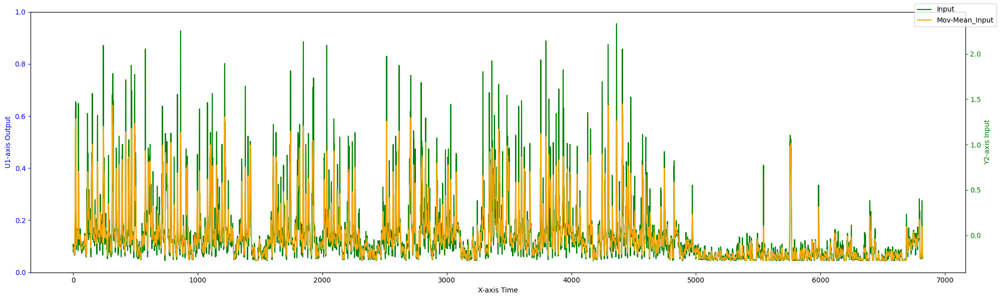

In [7]:
#1ºData Preparation
#Pre-processing

#High frequency disturbances (too high measurement frequency -> Downsampling)
#1ºlow pass filter | 2º Downsampling


#Outliers
dataset = athlete_list[8]

dataset['u'] = dataset['u'] - np.mean(dataset['u'])
dataset['y'] = dataset['y'] - np.mean(dataset['y'])

mov_avrg_u = dataset['u'].rolling(window=5, center=True, min_periods=1).mean()
mov_avrg_y = dataset['y'].rolling(window=2, center=True, min_periods=1).mean()
#result = mk.original_test(data)
trend = mk.original_test(dataset['y'])
#plot
fig, ax1 = plt.subplots(figsize=(20, 6))

#ax1.plot(dataset['y'], color='blue', label='Real_Output')
#ax1.plot(mov_avrg_y, color='red', label='Mov-Mean-output')
ax1.set_xlabel('X-axis Time')
ax1.set_ylabel('U1-axis Output', color='blue')
ax1.tick_params('y', colors='blue')

ax2 = ax1.twinx()
ax2.plot(dataset['u'], color='green', label='Input')
ax2.plot(mov_avrg_u, color='orange', label='Mov-Mean_Input')

ax2.set_ylabel('Y2-axis Input', color='green')
ax2.tick_params('y', colors='green')

fig.legend(loc="upper right")
fig.tight_layout()


Athlete:(7743, 2)
athlete['u'] Max: 1.3940000000000006 Min: 0.004000000000000095
athlete['y'] Max: 97.5 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.348 Min: 0.0
athlete['y'] Max: 78.0 Min: 0.0
Athlete:(7743, 2)
athlete['u'] Max: 1.432 Min: 0.005999999999999911
athlete['y'] Max: 90.0 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.388 Min: 0.0019999999999998222
athlete['y'] Max: 100.5 Min: 0.5
Athlete:(5895, 2)
athlete['u'] Max: 1.3080000000000003 Min: 0.0
athlete['y'] Max: 75.0 Min: 0.0
Athlete:(4626, 2)
athlete['u'] Max: 1.2119999999999997 Min: 0.0
athlete['y'] Max: 85.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.3119999999999998 Min: 0.004000000000000178
athlete['y'] Max: 101.5 Min: 1.0
Athlete:(4906, 2)
athlete['u'] Max: 1.3920000000000001 Min: 0.0
athlete['y'] Max: 105.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.7240000000000006 Min: 0.0
athlete['y'] Max: 114.0 Min: 0.5
Athlete:(4906, 2)
athlete['u'] Max: 1.5780000000000007 Min: 0.00400000000000071
athlete['y'] Max: 84.5

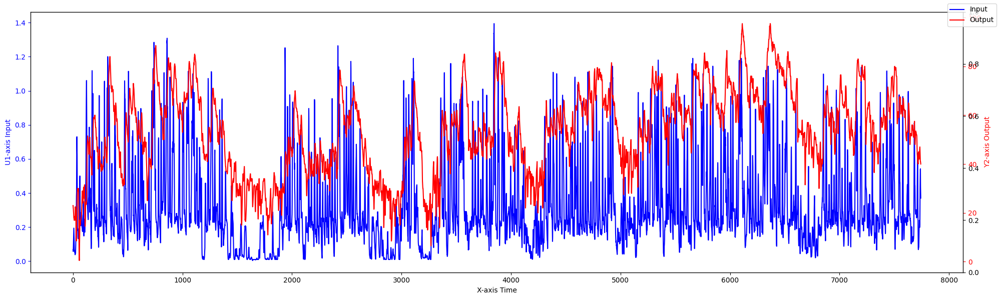

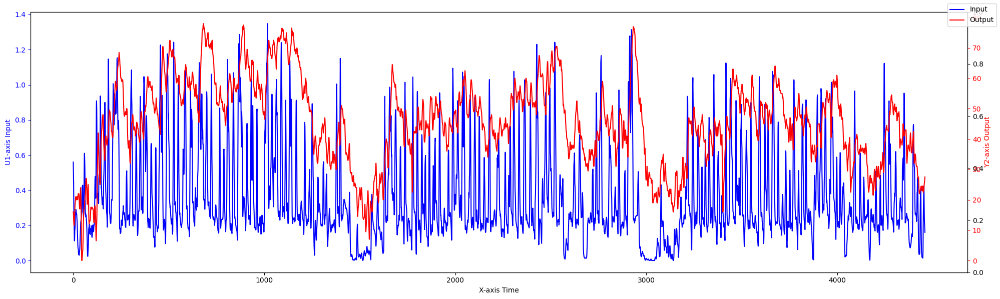

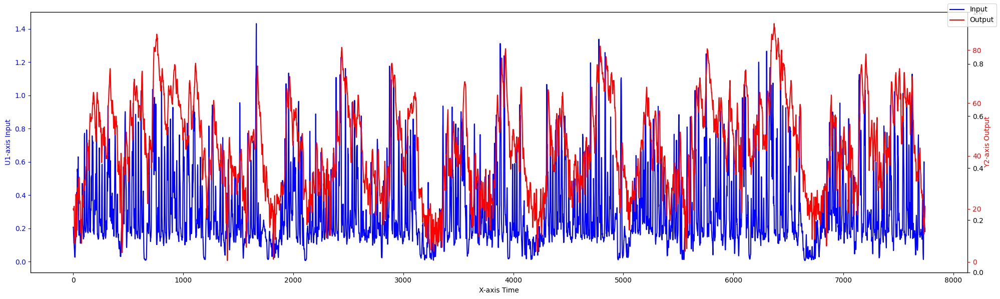

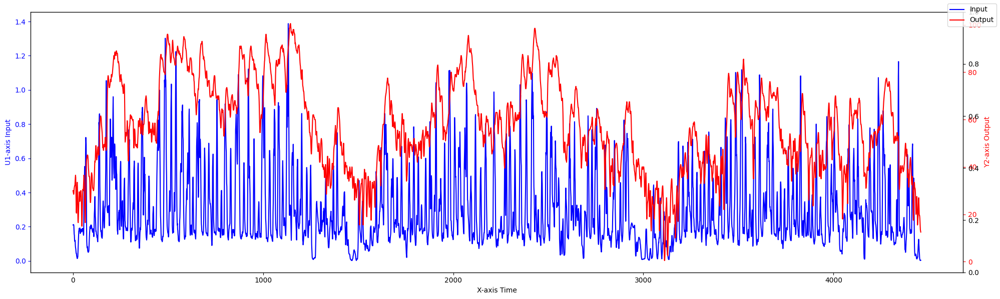

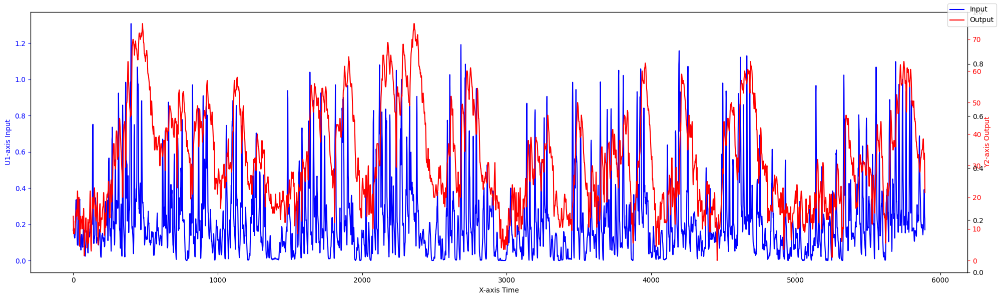

...

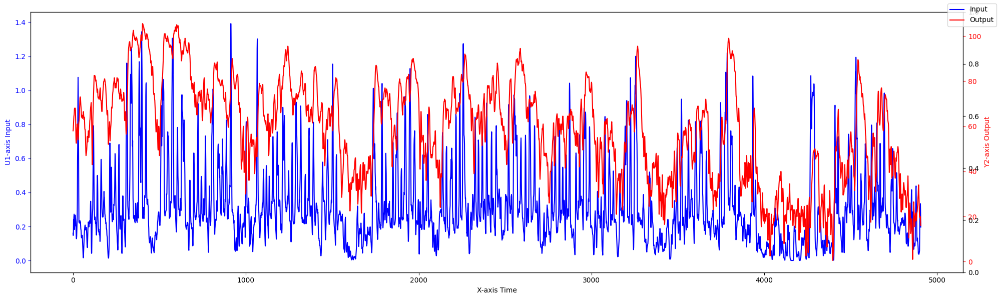

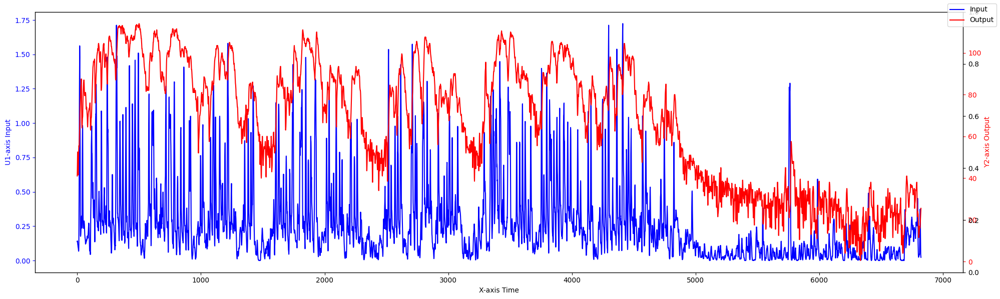

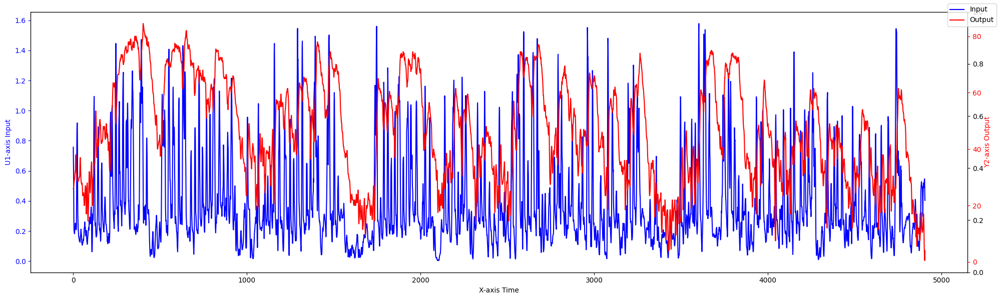

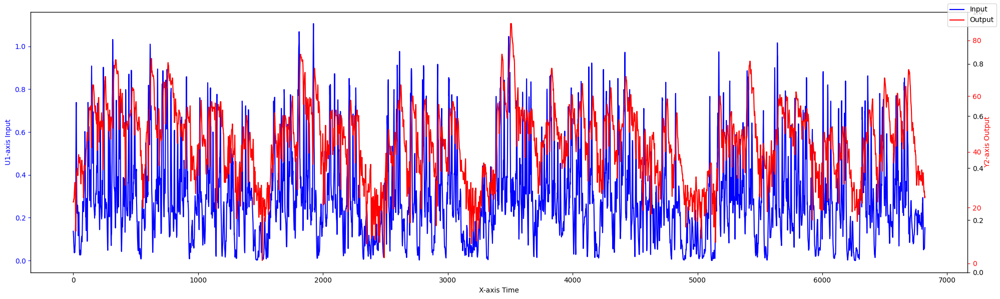

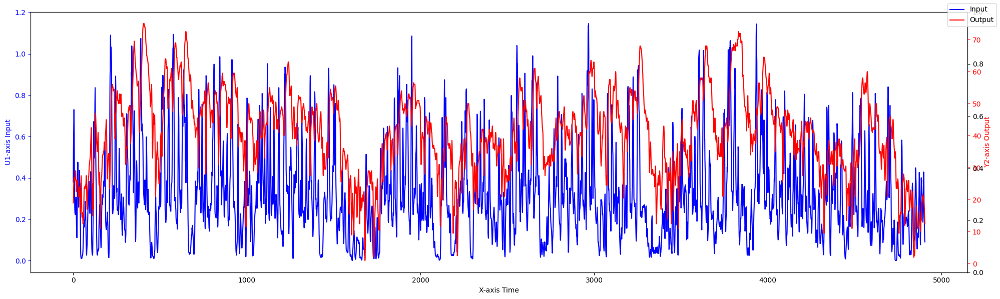

In [8]:
#1ºData Preparation
#Pre-processing && Ploting
limit = 0
for athlete in athlete_list:
  #Start all values at Zero
  print(f"Athlete:{athlete.shape}")
  #athlete['u'] = athlete['u'] - athlete['u'][0]
  #athlete['y'] = athlete['y'] - athlete['y'][0]

  athlete['u'] = athlete['u'] - athlete['u'].min()
  athlete['y'] = athlete['y'] - athlete['y'].min()

  athlete['u'] = athlete['u'].rolling(window=5, center=True, min_periods=1).mean()
  athlete['y'] = athlete['y'].rolling(window=2, center=True, min_periods=1).mean()


  #Ploting using two axis with different scales
  fig, ax1 = plt.subplots(figsize=(20, 6))
  ax1.plot(athlete['u'], color='blue', label='Input')
  ax1.set_xlabel('X-axis Time')
  ax1.set_ylabel('U1-axis Input', color='blue')
  ax1.tick_params('y', colors='blue')
  ax2 = ax1.twinx()
  print("athlete['u']",'Max:',athlete['u'].max(),'Min:',athlete['u'].min())
  print("athlete['y']",'Max:',athlete['y'].max(),'Min:',athlete['y'].min())

  #trend = mk.original_test(athlete['y'])
  ax3 = ax1.twinx()
  #ax3.plot(trend, color='green', label='Output')

  '''  if athlete.shape[0] == 7743 and limit == 0:
    print("tEAWDAWDrue")
    athlete_list[0]['u'] = athlete['u']
    athlete_list[0]['y'] = athlete['y']
    limit +=+ 1'''
  #y_mean = np.mean(athlete['y'])
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  ax2.plot(athlete['y'], color='red', label='Output')
  ax2.set_ylabel('Y2-axis Output', color='red')
  ax2.tick_params('y', colors='red')
  fig.legend(loc="upper right")
  fig.tight_layout()


In [9]:
#Smoothing the Data
#capture important patterns in the data, while leaving out noise or other fine-scale structures/rapid phenomena.

## 2º System Identification

Athlete: A1M1

Model #0 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.646507869999436, Akaike's information criteria: 10018.367043276934

Model #1 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: -2.5619477306342553, Akaike's information criteria: 9835.450439536073

Model #2 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-10-fae883fd573d>:52: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, new_row], ignore_index=True)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.4760005860799175, Akaike's information criteria: 9645.129590322837

Model #3 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -2.394949755194794, Akaike's information criteria: 9461.294271137516

Model #4 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.3246057838997696, Akaike's information criteria: 9298.054857034234

Model #5 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.361271589707112, Akaike's information criteria: 9388.564101500608

Model #6 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -2.2772211105163453, Akaike's information criteria: 9191.347808540935

Model #7 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.1981565993747454, Akaike's information criteria: 9001.164683306446

Model #8 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -2.128114509051194, Akaike's information criteria: 8828.65066552897

Model #9 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.068037924810121, Akaike's information criteria: 8677.472900327006

Model #10 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.398809200648542, Akaike's information criteria: 9475.310546232115

Model #11 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.31868743127294, Akaike's information criteria: 9289.467220777142

Model #12 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.2306307645859578, Akaike's information criteria: 9080.177731436132

Model #13 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.146102160928307, Akaike's information criteria: 8873.873014131457

Model #14 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.096298055879811, Akaike's information criteria: 8749.283072275264

Model #15 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.792435313301436, Akaike's information criteria: 10324.151818888904

Model #16 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.6802228244491952, Akaike's information criteria: 10090.407399035457

Model #17 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.575865620756623, Akaike's information criteria: 9866.541713886036

Model #18 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.521346758454225, Akaike's information criteria: 9746.41345733807

Model #19 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.517232943975514, Akaike's information criteria: 9736.112915079033

Model #20 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.721065334492146, Akaike's information criteria: -9880.812940940907

Model #21 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7222875909800334, Akaike's information criteria: -9913.530782495247

Model #22 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7211327597236764, Akaike's information criteria: -9880.130556256076

Model #23 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.71520108

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.3097132896026054, Akaike's information criteria: 5335.215138906473

Model #4 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.2377482228735586, Akaike's information criteria: 5236.0819143139315

Model #5 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: -2.283761129846182, Akaike's information criteria: 5304.5149742636895

Model #6 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.1826217486287867, Akaike's information criteria: 5163.892550512555

Model #7 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: -2.0931627613849173, Akaike's information criteria: 5035.688975619944

Model #8 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.020978439265212, Akaike's information criteria: 4929.36230997346

Model #9 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay
its regression yield r squared: -1.9666650916227697, Akaike's information criteria: 4847.450888173583

Model #10 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.241671233400187, Akaike's information criteria: 5247.828715771116

Model #11 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay
its regression yield r squared: -2.144129632805673, Akaike's information criteria: 5110.513342221061

Model #12 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.040079861485904, Akaike's information criteria: 4959.44226350571

Model #13 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay
its regression yield r squared: -1.952694740608134, Akaike's information criteria: 4828.426973184488

Model #14 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9089454360320155, Akaike's information criteria: 4760.871641489318

Model #15 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.6472488825796687, Akaike's information criteria: 5773.944367969715

Model #16 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.499946229357414, Akaike's information criteria: 5588.990581774627

Model #17 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.3790489707815463, Akaike's information criteria: 5431.16501358884

Model #18 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.330584177033585, Akaike's information criteria: 5365.616784447486

Model #19 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.343935984145516, Akaike's information criteria: 5382.225351465258

Model #20 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.8006232754763936, Akaike's information criteria: -7186.401275856017

Model #21 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.8041995296384141, Akaike's information criteria: -7265.47847569135

Model #22 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8001330226842908, Akaike's information criteria: -7172.230172510162

Model #23 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.78933530

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model #2 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.456901832491437, Akaike's information criteria: 6959.4948121828165

Model #3 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -1.369787815332772, Akaike's information criteria: 6679.212463873639

Model #4 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2879911093539773, Akaike's information criteria: 6406.542864717718

Model #5 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3943028724499427, Akaike's information criteria: 6762.606041087138

Model #6 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.3065979433837178, Akaike's information criteria: 6472.888338826453

Model #7 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.220435535890371, Akaike's information criteria: 6177.426333841018

Model #8 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.1381626850275044, Akaike's information criteria: 5884.469126616248

Model #9 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.060958419207155, Akaike's information criteria: 5599.175006872669

Model #10 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.209168994645033, Akaike's information criteria: 6140.851124032528

Model #11 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1257706075262148, Akaike's information criteria: 5842.245931798514

Model #12 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0354280728175729, Akaike's information criteria: 5505.44420391227

Model #13 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9521601998456535, Akaike's information criteria: 5181.5621199725665

Model #14 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.8918817955589482, Akaike's information criteria: 4938.256935974088

Model #15 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1890849937201193, Akaike's information criteria: 6071.379932016313

Model #16 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0944942283193035, Akaike's information criteria: 5728.7970744067325

Model #17 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0123523407572117, Akaike's information criteria: 5418.517806754832

Model #18 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9614397673669817, Akaike's information criteria: 5219.579032497893

Model #19 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9329669307767581, Akaike's information criteria: 5105.798874401551

Model #20 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6678127441606628, Akaike's information criteria: -8528.121000710447

Model #21 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.6886140823020136, Akaike's information criteria: -9027.596884259978

Model #22 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.6980443363941915, Akaike's information criteria: -9264.457131871079

Model #23 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.698068

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.2663063289773917, Akaike's information criteria: 5276.387995134304

Model #4 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.197667634501002, Akaike's information criteria: 5180.588583671968

Model #5 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: -2.194682308573239, Akaike's information criteria: 5181.911939015659

Model #6 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.120828002771144, Akaike's information criteria: 5076.504355383058

Model #7 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: -2.04798610583376, Akaike's information criteria: 4970.1276896304735

Model #8 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9763532803390063, Akaike's information criteria: 4863.0632418380255

Model #9 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay
its regression yield r squared: -1.9053404586924039, Akaike's information criteria: 4754.4162874233025

Model #10 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9119007745894336, Akaike's information criteria: 4769.668587552456

Model #11 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8322861007129019, Akaike's information criteria: 4645.0711728838905

Model #12 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.751501979758256, Akaike's information criteria: 4515.114604500038

Model #13 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6795283599897464, Akaike's information criteria: 4396.044096285019

Model #14 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6249958208564896, Akaike's information criteria: 4303.498140657001

Model #15 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8213863915600599, Akaike's information criteria: 4629.889716326097

Model #16 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7378735384052924, Akaike's information criteria: 4494.993752767134

Model #17 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6740223480051548, Akaike's information criteria: 4388.8824062726035

Model #18 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6386939170308485, Akaike's information criteria: 4328.674947422474

Model #19 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6189757102521924, Akaike's information criteria: 4294.311211739447

Model #20 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6937308280873249, Akaike's information criteria: -5272.294198540915

Model #21 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7082691380287838, Akaike's information criteria: -5487.915441448866

Model #22 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.6811795848585842, Akaike's information criteria: -5090.918361209155

Model #23 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.673798

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3999105997583574, Akaike's information criteria: 5160.917750294622

Model #2 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.3278371848818584, Akaike's information criteria: 4980.384062264388

Model #3 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2480877771929029, Akaike's information criteria: 4774.181150769925

Model #4 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.1668740027375706, Akaike's information criteria: 4556.652049863086

Model #5 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2675655418040166, Akaike's information criteria: 4828.639216387689

Model #6 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1947394236544624, Akaike's information criteria: 4635.485116103002

Model #7 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: -1.1153928330999747, Akaike's information criteria: 4417.775973668044

Model #8 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0361847570098823, Akaike's information criteria: 4192.248475623621

Model #9 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9636223713045506, Akaike's information criteria: 3977.843705159215

Model #10 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2472594356987248, Akaike's information criteria: 4776.819835343896

Model #11 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.177521695973227, Akaike's information criteria: 4590.301934533835

Model #12 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1095689370047999, Akaike's information criteria: 4402.788588701374

Model #13 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0390797902264017, Akaike's information criteria: 4201.904390052757

Model #14 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9615236218568304, Akaike's information criteria: 3972.872364791227

Model #15 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.316520399169828, Akaike's information criteria: 4956.8301719247775

Model #16 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2507912431263684, Akaike's information criteria: 4786.449908072378

Model #17 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.174333815331439, Akaike's information criteria: 4582.117776766323

Model #18 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0864765465711237, Akaike's information criteria: 4338.487283148792

Model #19 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0129346493716045, Akaike's information criteria: 4126.508004959147

Model #20 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.676145286358917, Akaike's information criteria: -6641.250881159278

Model #21 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7313104380904831, Akaike's information criteria: -7740.572413143687

Model #22 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7588900706863019, Akaike's information criteria: -8377.383617942673

Model #23 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.7685226

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.144312462045605, Akaike's information criteria: 3527.749281578091

Model #4 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.0778371745430722, Akaike's information criteria: 3381.4645290420635

Model #5 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: -1.1539912722723389, Akaike's information criteria: 3552.0993641827727

Model #6 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.09012702417979, Akaike's information criteria: 3412.1904410958937

Model #7 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: -1.0230027352042024, Akaike's information criteria: 3260.5822111208704

Model #8 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9570685198351006, Akaike's information criteria: 3106.759823970773

Model #9 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay
its regression yield r squared: -0.8967468928315936, Akaike's information criteria: 2961.4479877133294

Model #10 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.21735664646048, Akaike's information criteria: 3687.3678816616807

Model #11 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay
its regression yield r squared: -1.1529095350091185, Akaike's information criteria: 3550.2429615778833

Model #12 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0917725371578992, Akaike's information criteria: 3416.352576057646

Model #13 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay
its regression yield r squared: -1.031998645921131, Akaike's information criteria: 3281.6717686244115

Model #14 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -0.9688477481446054, Akaike's information criteria: 3135.1344931403974

Model #15 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.271320628561099, Akaike's information criteria: 3799.710561927421

Model #16 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2092372366080735, Akaike's information criteria: 3670.823238678917

Model #17 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1446429867813723, Akaike's information criteria: 3532.9357164485505

Model #18 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.076236633745181, Akaike's information criteria: 3382.4425254177

Model #19 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0189986893030554, Akaike's information criteria: 3252.6146051091873

Model #20 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.8194072680183637, Akaike's information criteria: -7911.737831761704

Model #21 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.8598355661606347, Akaike's information criteria: -9081.878020001956

Model #22 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8740354503805801, Akaike's information criteria: -9573.722273252883

Model #23 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.87997

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7046367501308866, Akaike's information criteria: 6787.679134125759

Model #3 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -1.6372007243313278, Akaike's information criteria: 6614.507198265583

Model #4 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.5738274428801602, Akaike's information criteria: 6447.696758478407

Model #5 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6123976612102666, Akaike's information criteria: 6553.9910550314

Model #6 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.5444522218120325, Akaike's information criteria: 6373.302958617767

Model #7 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4770761682433031, Akaike's information criteria: 6189.371020692906

Model #8 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.412499556467909, Akaike's information criteria: 6008.362859274623

Model #9 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3512465397228763, Akaike's information criteria: 5832.164359413296

Model #10 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.502017966803777, Akaike's information criteria: 6260.60558423044

Model #11 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4283585598911577, Akaike's information criteria: 6055.922762825843

Model #12 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3547015914114575, Akaike's information criteria: 5845.0306974296145

Model #13 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2881436381193914, Akaike's information criteria: 5648.709377486116

Model #14 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2364958532194286, Akaike's information criteria: 5492.268534940287

Model #15 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6725408486706042, Akaike's information criteria: 6711.279173913823

Model #16 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.5863826720927139, Akaike's information criteria: 6486.874369382665

Model #17 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.5179840692765536, Akaike's information criteria: 6303.217336634535

Model #18 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4780056977685034, Akaike's information criteria: 6193.207026632955

Model #19 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4589975965073623, Akaike's information criteria: 6139.822050272813

Model #20 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.5243393149930263, Akaike's information criteria: -5065.090685443217

Model #21 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.5573902431896359, Akaike's information criteria: -5555.570692599888

Model #22 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.5250924014982807, Akaike's information criteria: -5074.410859184747

Model #23 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.519673

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4797172906254343, Akaike's information criteria: 4454.63276769423

Model #3 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -1.4230349596605594, Akaike's information criteria: 4340.372304665311

Model #4 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.37043989231077, Akaike's information criteria: 4231.933253366336

Model #5 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.393454225079437, Akaike's information criteria: 4283.905214861017

Model #6 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.335544925271372, Akaike's information criteria: 4162.946395054272

Model #7 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2791875922773932, Akaike's information criteria: 4042.3610335563144

Model #8 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.2268305936122008, Akaike's information criteria: 3927.639227992185

Model #9 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.1786146044971484, Akaike's information criteria: 3819.5769440712156

Model #10 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay
its regression yield r squared: -1.2524868494912655, Akaike's information criteria: 3987.4069788851143

Model #11 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.197771174453273, Akaike's information criteria: 3866.0492345968332

Model #12 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay
its regression yield r squared: -1.1408999136082278, Akaike's information criteria: 3736.7699052468793

Model #13 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.081440811407023, Akaike's information criteria: 3597.9957233333525

Model #14 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.0351301558270003, Akaike's information criteria: 3487.0323401090423

Model #15 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3946894351249703, Akaike's information criteria: 4288.688903438607

Model #16 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3283692175816513, Akaike's information criteria: 4150.168936081321

Model #17 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2626972291354162, Akaike's information criteria: 4009.1320728664723

Model #18 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.2192258492308161, Akaike's information criteria: 3913.2790922595877

Model #19 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.203961514902316, Akaike's information criteria: 3878.675992475349

Model #20 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6000497615559615, Akaike's information criteria: -4491.0162788815505

Model #21 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.6146062335560607, Akaike's information criteria: -4671.91347596605

Model #22 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.5171866453667664, Akaike's information criteria: -3565.99750917068

Model #23 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.50784374

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6162972806718021, Akaike's information criteria: 6562.16541386266

Model #2 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.5793779499662088, Akaike's information criteria: 6464.27916865625

Model #3 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.539307411206885, Akaike's information criteria: 6356.567259498687

Model #4 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.4986514272954583, Akaike's information criteria: 6245.591390117739

Model #5 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.491072918605075, Akaike's information criteria: 6229.61884267763

Model #6 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4539514499745096, Akaike's information criteria: 6126.311013225643

Model #7 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4139980646194914, Akaike's information criteria: 6013.477784511966

Model #8 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3735560771595203, Akaike's information criteria: 5897.4061457274975

Model #9 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.334678263417111, Akaike's information criteria: 5783.9576915765165

Model #10 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.46874210837411, Akaike's information criteria: 6169.293695829851

Model #11 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4332268528994447, Akaike's information criteria: 6069.579583924724

Model #12 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3936426228215626, Akaike's information criteria: 5956.861639991118

Model #13 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3519578584158527, Akaike's information criteria: 5836.226383155624

Model #14 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.3134588265830551, Akaike's information criteria: 5722.87727855059

Model #15 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6969888541701108, Akaike's information criteria: 6773.374780327881

Model #16 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.655887054271909, Akaike's information criteria: 6667.677217255478

Model #17 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6102384864151982, Akaike's information criteria: 6548.513327658158

Model #18 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.5681358986779186, Akaike's information criteria: 6436.71695529081

Model #19 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.5352841480337225, Akaike's information criteria: 6348.033486677278

Model #20 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.841598487666666, Akaike's information criteria: -12566.369003747492

Model #21 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.8620871035534732, Akaike's information criteria: -13509.308044822283

Model #22 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8147232322921143, Akaike's information criteria: -11493.8688959301

Model #23 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.820005

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -1.8435376947330764, Akaike's information criteria: 5124.829924139996

Model #4 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.747967169139348, Akaike's information criteria: 4956.231854242053

Model #5 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8646884732224174, Akaike's information criteria: 5165.261922068376

Model #6 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.7775192380021996, Akaike's information criteria: 5012.699702023984

Model #7 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6840581040492029, Akaike's information criteria: 4843.891008914331

Model #8 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.5889068399338253, Akaike's information criteria: 4666.006249465023

Model #9 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.4965721765725317, Akaike's information criteria: 4487.101442061324

Model #10 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay
its regression yield r squared: -1.8071710371126652, Akaike's information criteria: 5066.764948274358

Model #11 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7184936365301113, Akaike's information criteria: 4908.38194814981

Model #12 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay
its regression yield r squared: -1.6225132574859136, Akaike's information criteria: 4731.216404265064

Model #13 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.531558149629149, Akaike's information criteria: 4557.291414682787

Model #14 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay
its regression yield r squared: -1.4497858465841578, Akaike's information criteria: 4395.506994164505

Model #15 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9685701958992974, Akaike's information criteria: 5341.770225579413

Model #16 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8698491719474895, Akaike's information criteria: 5174.925687279619

Model #17 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7755400958828473, Akaike's information criteria: 5010.142251297116

Model #18 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6971995342000668, Akaike's information criteria: 4868.856509360187

Model #19 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.633509137917196, Akaike's information criteria: 4750.817791613359

Model #20 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6394472782220848, Akaike's information criteria: -4999.674310198695

Model #21 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7043200147226345, Akaike's information criteria: -5971.413857735551

Model #22 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7245447613489471, Akaike's information criteria: -6317.585660364056

Model #23 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.7450486

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.2799452102468227, Akaike's information criteria: 8102.978217193028

Model #3 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -2.150576874992457, Akaike's information criteria: 7827.386008571468

Model #4 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.040371948910157, Akaike's information criteria: 7583.478682404844

Model #5 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.2229238694071847, Akaike's information criteria: 7986.541142949607

Model #6 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -2.0901975148927803, Akaike's information criteria: 7698.562765090693

Model #7 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9659054578603512, Akaike's information criteria: 7417.496566763038

Model #8 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.854908460219292, Akaike's information criteria: 7156.353217472817

Model #9 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7579400845373088, Akaike's information criteria: 6919.737802198457

Model #10 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9996261069611219, Akaike's information criteria: 7497.685772236571

Model #11 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8615193730783295, Akaike's information criteria: 7175.174286987636

Model #12 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7224030011407687, Akaike's information criteria: 6834.328905863117

Model #13 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6024522165953976, Akaike's information criteria: 6526.148013902911

Model #14 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.5190348002636704, Akaike's information criteria: 6303.137537220746

Model #15 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.29921992614057, Akaike's information criteria: 8147.745205709465

Model #16 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.1072561743404545, Akaike's information criteria: 7737.8398498748065

Model #17 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9690444798635203, Akaike's information criteria: 7426.53328728169

Model #18 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9080005614948354, Akaike's information criteria: 7283.846570795197

Model #19 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9015576299000347, Akaike's information criteria: 7267.66312018661

Model #20 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7441779668036624, Akaike's information criteria: -9296.25017345065

Model #21 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7492341250393573, Akaike's information criteria: -9431.04964720134

Model #22 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7313399499772937, Akaike's information criteria: -8959.583650509829

Model #23 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.725679574

<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.3477432728850633, Akaike's information criteria: 5927.436843720415

Model #2 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -2.2293776155131293, Akaike's information criteria: 5749.735075153146

Model #3 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -2.1140163730321317, Akaike's information criteria: 5570.247149914936

Model #4 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.008719871464225, Akaike's information criteria: 5400.523527184786

Model #5 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.163268428403499, Akaike's information criteria: 5651.474871897324

Model #6 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.049318800013435, Akaike's information criteria: 5470.444039604546

Model #7 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.9380376633247676, Akaike's information criteria: 5287.090779313926

Model #8 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8327606962114147, Akaike's information criteria: 5107.174812940178

Model #9 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay
its regression yield r squared: -1.7352871088928623, Akaike's information criteria: 4934.558390348482

Model #10 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8870068654936634, Akaike's information criteria: 5204.260026710764

Model #11 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay
its regression yield r squared: -1.7748158778175265, Akaike's information criteria: 5008.904702628665

Model #12 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.6508873315741726, Akaike's information criteria: 4783.957582093036

Model #13 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay
its regression yield r squared: -1.5353837016098182, Akaike's information criteria: 4564.69043713751

Model #14 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay
its regression yield r squared: -1.4505134774852544, Akaike's information criteria: 4396.9618701118425

Model #15 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.170802621047725, Akaike's information criteria: 5664.83323764135

Model #16 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -2.0094854743209956, Akaike's information criteria: 5407.7704835133545

Model #17 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8792133953171453, Akaike's information criteria: 5189.8339380583675

Model #18 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.8137801159401534, Akaike's information criteria: 5076.156671124301

Model #19 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-4-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)


its regression yield r squared: -1.7927812833942838, Akaike's information criteria: 5038.432001800572

Model #20 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7335934817801454, Akaike's information criteria: -6483.999836196754

Model #21 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7455172111706362, Akaike's information criteria: -6707.232244363518

Model #22 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7418218308900209, Akaike's information criteria: -6635.178552888413

Model #23 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.736960

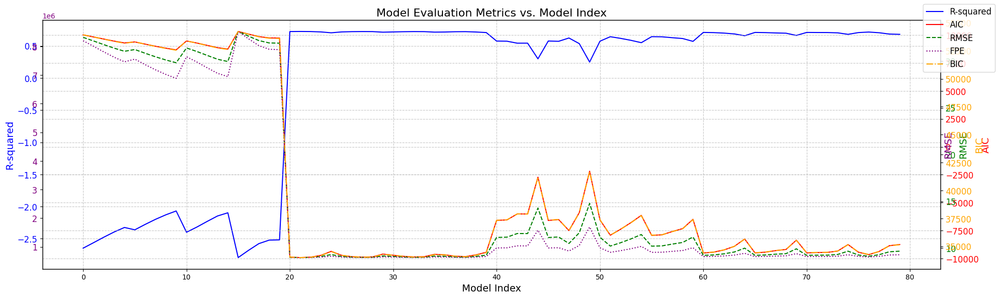

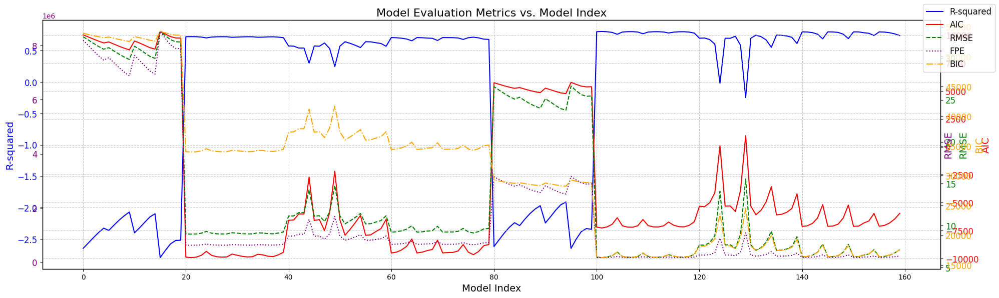

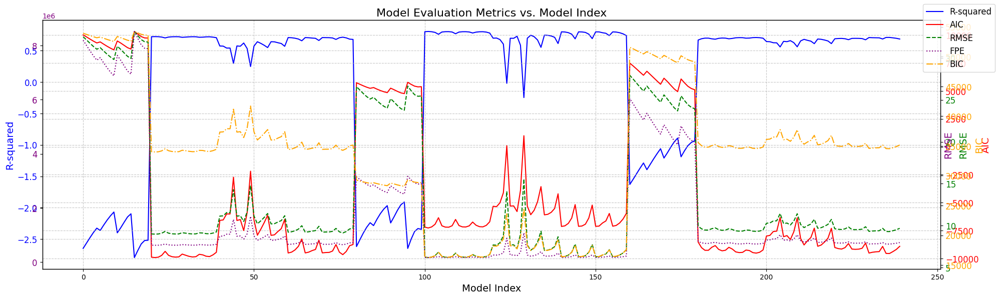

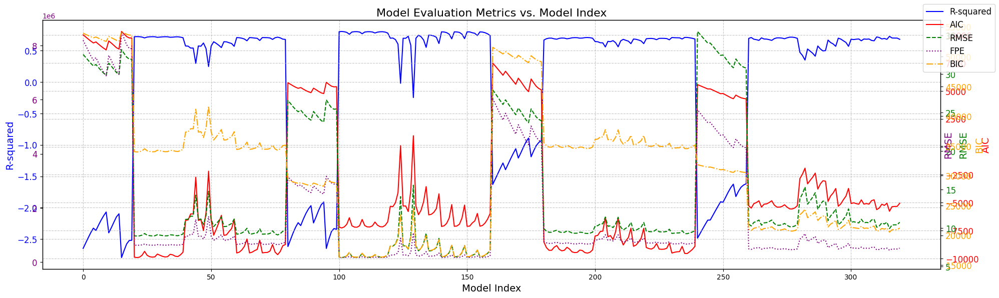

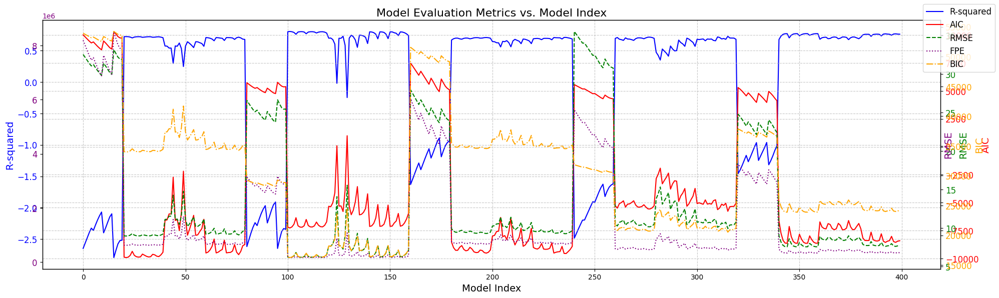

...

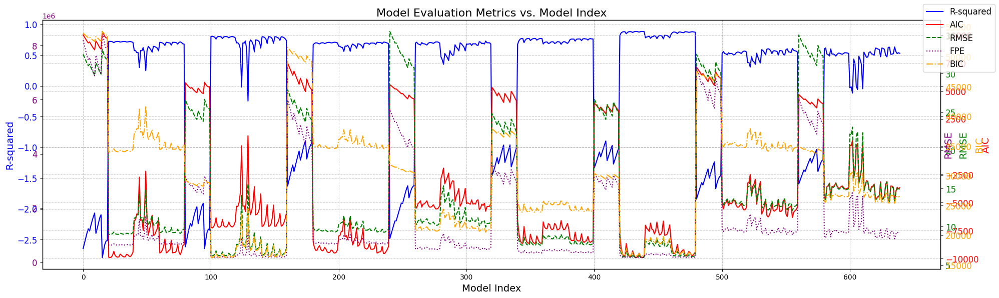

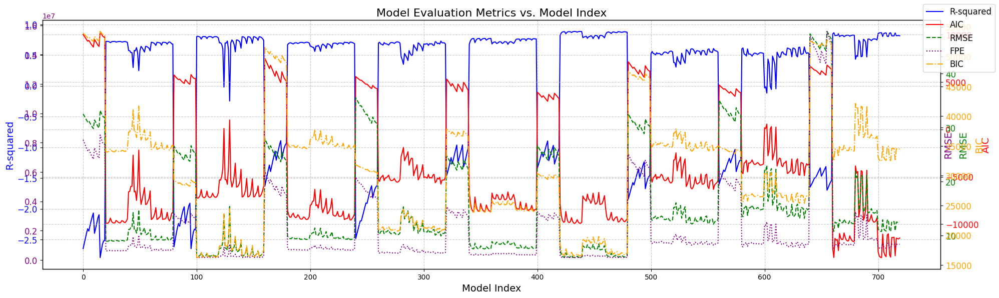

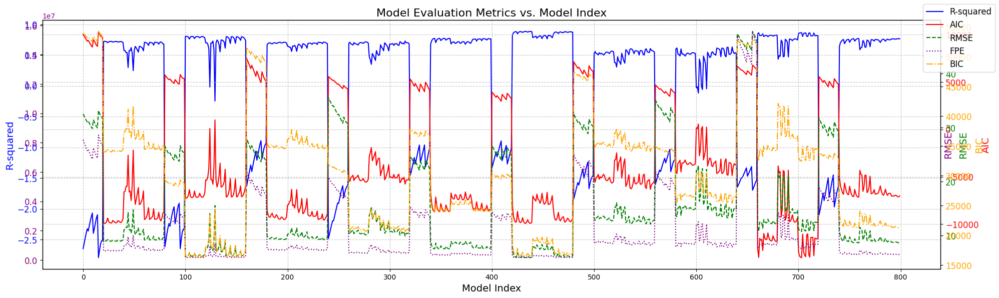

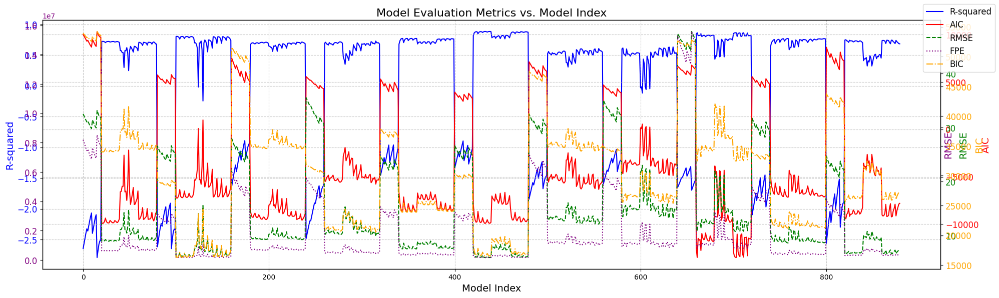

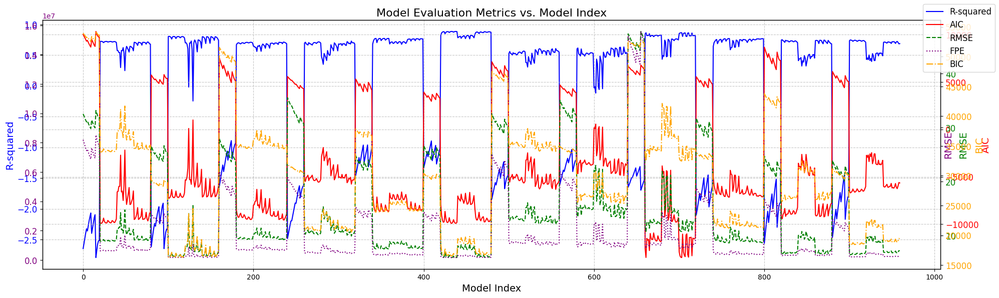

In [10]:
from re import X
# Find the best model structure (time-invariant modelling)
results_df = pd.DataFrame(columns=['Athlete_Code','Model_Index', 'na', 'nb', 'd', 'AIC', 'Rsq','RMSE','BIC','FPE'])
selected_models = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]

# Calculate ARX models to the evaluation data with all possible parameters to find the best fit by checking r-squared and AIC
# Define a max for a, b, and delay (d)
na_max = nb_max = xdelay_max = 4
model_count=0

##Loop through parameters
#Starts 1:1:0 .... 3,3,3               (1,na_max|1,nb_max|xdelay_max) (max=4)
#Starts 1:1:0 .... 4,4,4               (1,na_max+1|1,nb_max+1|xdelay_max+1)(max=4)
#Starts 0:1:0 .... 3,4,4               (na_max|1,nb_max+1|xdelay_max+1)(max=4)

for i in range(len(athlete_list)):
  data = athlete_list[i]
  model_count=0
  print(f"Athlete: {code_name[i]}")
  for na in range(na_max):
    for nb in range(1,nb_max+1):
      for d in range(xdelay_max+1):
        print('\nModel #{} Dataset:{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,code_name[i],na,nb,d))
        #load the associated data using dataloader(data, na, nb, d)
        X_loader, y_loader = dataloader(data, na,  nb, d)
        #print("X_loader:",X_loader)#print("y_loader:",y_loader)


        #Correction to use python## Only when values are equal to zero
        if X_loader.empty:#
            print("Skipping model due to empty X_loader.")
            continue # proceed to next iteration
        if y_loader.empty:
            print("Skipping model due to empty y_loader.")
            continue # proceed to next iteration


        ##Calculate the a and b parameters
        y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, na, nb, d)


        ## Model evaluation for each generated model use r_squared and aic def above
        # Calculate r-squared and AIC and RMSE and BIC and FPE


        print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))



        # Save relevant information to the empty lists
        new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b]})
        results_df = pd.concat([results_df, new_row], ignore_index=True)

        # Update the model counter
        model_count += 1



  #Plot for each player/game
  fig, ax1 = plt.subplots(figsize=(20, 6))
  X_axis = np.arange(len(results_df)) #results_df['Model_Index']

  #For R-square Error
  ax1.plot(X_axis, results_df['Rsq'], color='blue', label='R-squared')
  ax1.set_xlabel('Model Index', fontsize=14)  # Increased font size
  ax1.set_ylabel('R-squared', color='blue', fontsize=14)  # Increased font size
  ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

  #For AIC
  ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
  ax2.plot(X_axis, results_df['AIC'], color='red', label='AIC')
  ax2.set_ylabel('AIC', color='red', fontsize=14)  # Increased font size
  ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size

  #For RMSE
  ax3 = ax1.twinx()
  ax3.plot(X_axis, results_df['RMSE'], color='green', label='RMSE', linestyle='--')
  ax3.set_ylabel('RMSE', color='green', fontsize=14)
  ax3.tick_params(axis='y', labelcolor='green', labelsize=12)

  #For FPE
  ax4 = ax1.twinx()
  ax4.plot(X_axis, results_df['FPE'], color='purple', label='FPE', linestyle=':')
  ax4.set_ylabel('RMSE', color='purple', fontsize=14)
  ax4.tick_params(axis='y', labelcolor='purple', labelsize=12)

  #For BIC
  ax5 = ax4.twinx()
  ax5.plot(X_axis, results_df['BIC'], color='orange', label='BIC', linestyle='-.')
  ax5.set_ylabel('BIC', color='orange', fontsize=14)
  ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)

  # General graphic configs
  fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
  ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  plt.title('Model Evaluation Metrics vs. Model Index', fontsize=16)  # Added title with increased font size
  plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()

In [11]:
results_df

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,53930.646087,8.198820e+06,[],[108.39783138461151]
1,A1M1,1,0,1,1,9835.450440,-2.561948,32.153837,53739.727384,8.005250e+06,[],[109.04348028704642]
2,A1M1,2,0,1,2,9645.129590,-2.476001,31.758536,53541.294820,7.808617e+06,[],[109.69736133981839]
3,A1M1,3,0,1,3,9461.294271,-2.394950,31.380915,53349.236301,7.623042e+06,[],[110.31272474402218]
4,A1M1,4,0,1,4,9298.054857,-2.324606,31.048527,53177.546996,7.461446e+06,[],[110.85129249317161]
...,...,...,...,...,...,...,...,...,...,...,...,...
955,A6M2,75,3,4,0,-6084.636549,0.711803,6.900740,18997.168715,2.341019e+05,"[2.196355362486569, -1.7895616472482654, 0.584...","[0.8711822507742575, -0.207354745507494, -0.79..."
956,A6M2,76,3,4,1,-6253.779846,0.721650,6.781659,18822.682166,2.260462e+05,"[2.1933011935122946, -1.785554085479578, 0.583...","[1.2161962020509893, -0.8610036760065074, -0.0..."
957,A6M2,77,3,4,2,-5980.964611,0.705790,6.972085,19090.238589,2.388703e+05,"[2.1914459496438137, -1.7862987493540838, 0.58...","[1.0877828060209733, 0.5985560311400908, -2.60..."
958,A6M2,78,3,4,3,-5607.180113,0.682543,7.242186,19458.763800,2.576842e+05,"[2.1862659230030017, -1.780432164054476, 0.583...","[2.3497462940958895, -1.8195026383336055, -1.4..."


In [12]:
#Select Best Models
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(results_df[['AIC', 'Rsq', 'FPE', 'BIC', 'RMSE']])
# Create a new DataFrame with the normalized metrics
normalized_df = pd.DataFrame(normalized_metrics, columns=['AIC_norm', 'Rsq_norm', 'FPE_norm', 'BIC_norm', 'RMSE_norm'])
selection_df = pd.concat([results_df, normalized_df], axis=1)


#best_models_df = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]
best_models_df = pd.DataFrame()


num_models = na_max*nb_max*(xdelay_max+1)
cases = len(results_df)/(num_models) #12

#LOOP for each case (models)
for i in range(int(cases)):
  print("Case: ",i,"Start: ",(i*num_models),"End: ",(i+1)*num_models)
  #Select each dataset models data
  selected_df = selection_df[(i*num_models):(i+1)*num_models].copy()

  #Create a Ranking Selection
  selected_df['AIC_rank'] = selected_df['AIC'].rank()
  selected_df['BIC_rank'] = selected_df['BIC'].rank()

  # Rank by Rsq
  selected_df['Rsq_rank'] = selected_df['Rsq'].rank(ascending=False)  # Note: ascending=False for Rsq

  # Calculate the combined ranking
  selected_df['Ranking'] = selected_df['Rsq_rank'] + selected_df['AIC_rank']+ selected_df['BIC_rank']

  best_df = selected_df.sort_values(by='Ranking', ascending=True).iloc[0]
  #new_row = pd.DataFrame({'Athlete_Code':[filter['Athlete_Code'][0]],'ParamCount'["{}:{}:{}".format(filter['na'][0],filter['nb'][0],filter['d'][0])],'ParamValues':[],'Metrics':[filter['Rsq'][0],filter['AIC'][0],filter['FPE'][0]]})

  #print(best_df)
  #print(selected_df.sort_values(by='Ranking', ascending=True))



  new_row = pd.DataFrame({'Athlete_Code': [best_df['Athlete_Code']],
                          'na': [best_df['na']],
                          'nb': [best_df['nb']],
                          'd': [best_df['d']],
                          'Ranking': [best_df['Ranking']],
                          'AIC_rank': [best_df['AIC_rank']],
                          'Rsq_rank': [best_df['Rsq_rank']],
                          'BIC_rank': [best_df['BIC_rank']],
                          'Rsq': [best_df['Rsq']],
                          'AIC': [best_df['AIC']],
                          'BIC': [best_df['BIC']],
                          'FPE': [best_df['FPE']],
                          'Parameters_a':[parameters_a],
                          'Parameters_b':[parameters_b]})

  best_models_df = pd.concat([best_models_df, new_row], ignore_index=True)

  #print(selected_df.sort_values(by='Rsq', ascending=False)[:3])
  #print(selected_df.sort_values(by='AIC', ascending=True)[:3])
  #print(selected_df.sort_values(by='FPE', ascending=True)[:3])


Case:  0 Start:  0 End:  80
Case:  1 Start:  80 End:  160
Case:  2 Start:  160 End:  240
Case:  3 Start:  240 End:  320
Case:  4 Start:  320 End:  400
Case:  5 Start:  400 End:  480
Case:  6 Start:  480 End:  560
Case:  7 Start:  560 End:  640
Case:  8 Start:  640 End:  720
Case:  9 Start:  720 End:  800
Case:  10 Start:  800 End:  880
Case:  11 Start:  880 End:  960


In [13]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,1,1,3.0,1.0,1.0,1.0,0.722288,-9913.530782,33997.700448,6.243022e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
1,A1M2,1,1,1,3.0,1.0,1.0,1.0,0.804200,-7265.478476,16258.200534,1.705110e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
2,A2M1,3,4,1,3.0,1.0,1.0,1.0,0.709525,-9552.010572,34542.696412,6.677319e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
3,A2M2,3,4,0,3.0,1.0,1.0,1.0,0.726973,-5770.705147,20526.231224,4.416951e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
4,A3M1,1,1,4,5.0,1.0,3.0,1.0,0.769506,-8639.758298,23883.641210,3.389779e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
5,A3M2,1,3,3,3.0,1.0,1.0,1.0,0.883155,-9910.707407,16531.451194,1.645240e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
6,A4M1,3,4,0,3.0,1.0,1.0,1.0,0.605469,-6328.062712,34093.618148,1.004757e+06,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
7,A4M2,3,4,0,3.0,1.0,1.0,1.0,0.631495,-4879.669261,25366.690850,8.584501e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
8,A5M1,3,1,3,3.0,1.0,1.0,1.0,0.862438,-13518.725705,32476.977362,7.950670e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
9,A5M2,1,4,3,3.0,1.0,1.0,1.0,0.767969,-7146.870774,21221.631477,3.702689e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."


In [14]:
results_df.sort_values(by='Rsq', ascending=False)
#Rsq: 1,5,0,16,11,6,15,10,61
#AIC: 1,5,0,6,11,16,15,10,61
#FPE: 0,5,1,60,72,71,62,75,76

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
433,A3M2,33,1,3,3,-9910.707407,0.883155,5.962353,16531.451194,1.645240e+05,[0.9814369680556814],"[2.932728065301651, -2.001857153835328, 1.9265..."
438,A3M2,38,1,4,3,-9901.566060,0.883029,5.965100,16540.571662,1.647114e+05,[0.9812392004312193],"[2.8639899515086413, -1.6277990114795693, 1.30..."
437,A3M2,37,1,4,2,-9896.558087,0.882847,5.970198,16552.038664,1.650287e+05,[0.9807220125123799],"[1.6566828504294762, -0.08374367146297601, -0...."
432,A3M2,32,1,3,2,-9896.053258,0.882729,5.973680,16552.563283,1.651854e+05,[0.9815957472667369],"[1.970561973402509, -1.7815802940105494, 2.656..."
428,A3M2,28,1,2,3,-9831.545309,0.881029,6.016823,16610.632865,1.675075e+05,[0.9827136340774631],"[1.5078325739352036, 1.1531925924292383]"
...,...,...,...,...,...,...,...,...,...,...,...,...
80,A1M2,0,0,1,0,5734.788243,-2.617079,26.580349,29260.978261,3.151764e+06,[],[89.04864822739364]
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,53930.646087,8.198820e+06,[],[108.39783138461151]
95,A1M2,15,0,4,0,5773.944368,-2.647249,26.653921,29291.135944,3.171371e+06,[],"[118.83185264517081, -71.70992504561283, -92.5..."
16,A1M1,16,0,4,1,10090.407399,-2.680223,32.666905,53990.761234,8.265967e+06,[],"[149.72151907171812, -89.92180942856018, -117...."



Model with 1 a parameters, 2 b parameters and 0 time delay
[   0    1    2 ... 7738 7739 7740]


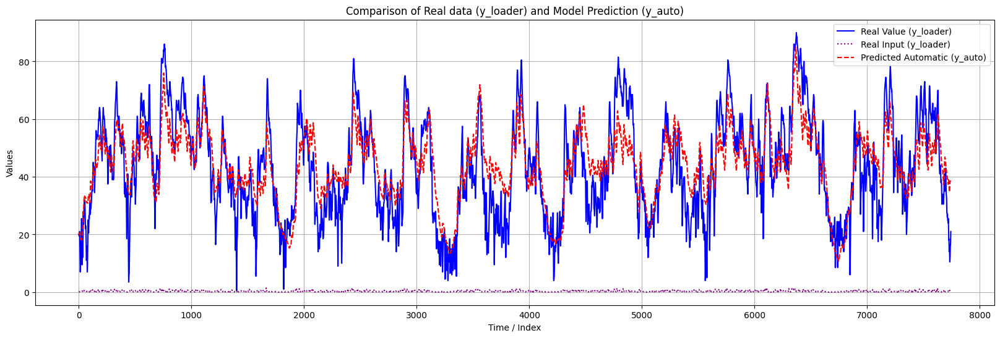

In [15]:
#Simulation best model structure
number_a=1
number_b=2
d=0

data = athlete_list[2]
# print the relative dataframe and check its columns
y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)


'''y = np.zeros(len(data))
y_auto = np.zeros(len(data))
y_auto[:max(number_a,number_b+d)] = data['y'][0]
#works for (0,1,0),(1,0,0)
for k in range(max(number_a,number_b +d), len(X_loader)):
  ##AUTOMATIC
  # Add the contribution from autoregressive terms (endogenous variables)
  for i_a in range(1, number_a + 1):
      y_auto[k] += den[i_a-1] * y_auto[k - i_a]  # Note: parameters_a starts at index 0
  # Add the contribution from exogenous input terms (with delay d)
  for j_b in range(number_b):
    #print("Input: ",'u-{}'.format(j_b+d))
    y_auto[k] += num[j_b] * X_loader['u-{}'.format(j_b+d)].iloc[k-j_b-d]'''



#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,y_loader.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()

In [16]:
#Select one model and applie to all the datasets
number_a=1
number_b=2
d=0
one_4_all = pd.DataFrame(columns=['Athlete_Code', 'na', 'nb', 'd','SSG','TC' ,'AIC', 'Rsq','RMSE','BIC','FPE'])
model_count=0

for i in range(len(athlete_list)):
  data = athlete_list[i]
  print(f"Athlete: {code_name[i]}")
  print('\nModel #{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,number_a,number_b,d))
  #load the associated data using dataloader(data, na, nb, d)

  y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)



  new_row = pd.DataFrame({'Athlete_Code': code_name[i],'SSG':[SSG],'TC':[tau], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b], 'na': [number_a], 'nb': [number_b], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})

  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)



  print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))

  # Save relevant information to the empty lists
  #new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})
  #results_df = pd.concat([results_df, new_row], ignore_index=True)
        # Update the model counter
  model_count += 1



#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?



Athlete: A1M1

Model #0 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


<ipython-input-16-d00dfd0a3003>:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)


its regression yield r squared: 0.7151370788107558, Akaike's information criteria: -9714.73901872165
Athlete: A1M2

Model #1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7955200529599864, Akaike's information criteria: -7070.118165155924
Athlete: A2M1

Model #2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.6811110453980813, Akaike's information criteria: -8841.284435520352
Athlete: A2M2

Model #3 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7026399147460015, Akaike's information criteria: -5400.713516721713
Athlete: A3M1

Model #4 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7022255

In [17]:
one_4_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,2,0,159.137013,-80.249100,-9714.739019,0.715137,9.092996,34203.446498,6.405421e+05,[0.9876161202412641],"[-1.126606594455808, 3.0973402266176726]"
1,A1M2,1,2,0,126.531391,-62.888709,-7070.118165,0.795520,6.317275,16459.963300,1.781493e+05,[0.9842246494978669],"[-1.090307582394874, 3.0863846288538332]"
2,A2M1,1,2,0,143.682432,-56.213342,-8841.284436,0.681111,9.725969,35245.309409,7.328236e+05,[0.982367925707955],"[-1.3266942696185609, 3.8601135938988658]"
3,A2M2,1,2,0,189.671076,-84.550536,-5400.713517,0.702640,10.377003,20885.010972,4.806938e+05,[0.9882424207505923],"[-0.46253168236010284, 2.692604391758069]"
4,A3M1,1,2,0,144.435236,-77.959261,-7132.891273,0.702226,8.622384,25417.350064,4.385643e+05,[0.9872547057214746],"[-3.8514928418954417, 5.69236243487436]"
5,A3M2,1,2,0,154.268093,-78.224008,-8652.283686,0.846256,6.842124,17810.129831,2.167521e+05,[0.9872975666173881],"[-2.85101861035034, 4.8105987838713995]"
6,A4M1,1,2,0,168.738422,-76.501230,-5252.817617,0.537438,13.129390,35152.630516,1.176845e+06,[0.9870133781440189],"[-1.8179498335480364, 4.009291915859838]"
7,A4M2,1,2,0,182.146499,-78.887063,-4479.816848,0.599374,13.775616,25750.897686,9.317597e+05,[0.9874036567906999],"[-1.1769583083308928, 3.471338124611437]"
8,A5M1,1,2,0,225.543030,-158.444814,-12778.087155,0.846526,11.397564,33222.921855,8.868582e+05,[0.993708528998255],"[-2.5388071165275563, 3.957804551633064]"
9,A5M2,1,2,0,124.515497,-79.165850,-5654.619747,0.684718,10.124096,22730.212799,5.032623e+05,[0.9874477358679957],"[-3.1820156633230976, 4.744967067007703]"


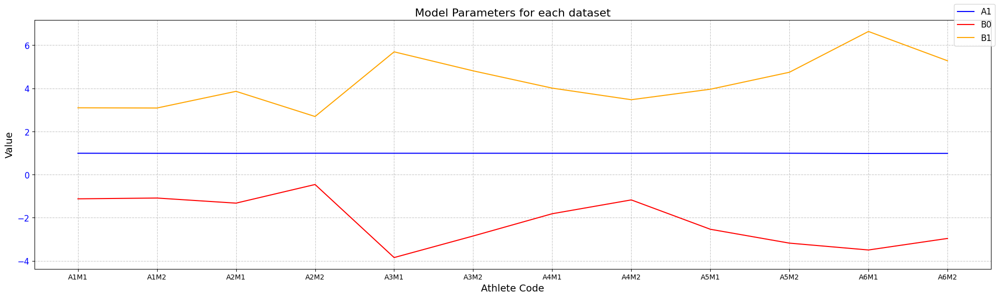

In [18]:
#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?
athlete_codes = one_4_all['Athlete_Code'].to_list()

#Plot for each player/game
fig, ax1 = plt.subplots(figsize=(20, 6))
X_axis = athlete_codes #results_df['Model_Index']

#plot parameters A
ax1.plot(X_axis, one_4_all['Parameters_a'].str[0].tolist(), color='blue', label='A1')
#ax1.plot(X_axis, one_4_all['Param_a'].str[1].tolist(), color='blue', label='A2')
#ax1.plot(X_axis, one_4_all['Param_a'].str[2].tolist(), color='blue', label='A3')
ax1.set_xlabel('Athlete Code', fontsize=14)  # Increased font size
ax1.set_ylabel('Value', fontsize=14)  # Increased font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

#Plot parameters B
ax1.plot(X_axis, one_4_all['Parameters_b'].str[0].tolist(), color='red', label='B0')
ax1.plot(X_axis, one_4_all['Parameters_b'].str[1].tolist(), color='orange', label='B1')
#ax1.plot(X_axis, one_4_all['Param_b'].str[2].tolist(), color='red', label='B2')

'''#First param B
x2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(X_axis, one_4_all['Param_b'].str[0].tolist(), color='red', label='AIC')
#ax2.plot(X_axis, one_4_all['Param_b'].str[1].tolist(), color='red', label='AIC')
ax2.set_ylabel('Param_b', color='red', fontsize=14)  # Increased font size
ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size
'''


# General graphic configs
fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
plt.title('Model Parameters for each dataset', fontsize=16)  # Added title with increased font size
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()


In [19]:
one_4_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,2,0,159.137013,-80.249100,-9714.739019,0.715137,9.092996,34203.446498,6.405421e+05,[0.9876161202412641],"[-1.126606594455808, 3.0973402266176726]"
1,A1M2,1,2,0,126.531391,-62.888709,-7070.118165,0.795520,6.317275,16459.963300,1.781493e+05,[0.9842246494978669],"[-1.090307582394874, 3.0863846288538332]"
2,A2M1,1,2,0,143.682432,-56.213342,-8841.284436,0.681111,9.725969,35245.309409,7.328236e+05,[0.982367925707955],"[-1.3266942696185609, 3.8601135938988658]"
3,A2M2,1,2,0,189.671076,-84.550536,-5400.713517,0.702640,10.377003,20885.010972,4.806938e+05,[0.9882424207505923],"[-0.46253168236010284, 2.692604391758069]"
4,A3M1,1,2,0,144.435236,-77.959261,-7132.891273,0.702226,8.622384,25417.350064,4.385643e+05,[0.9872547057214746],"[-3.8514928418954417, 5.69236243487436]"
5,A3M2,1,2,0,154.268093,-78.224008,-8652.283686,0.846256,6.842124,17810.129831,2.167521e+05,[0.9872975666173881],"[-2.85101861035034, 4.8105987838713995]"
6,A4M1,1,2,0,168.738422,-76.501230,-5252.817617,0.537438,13.129390,35152.630516,1.176845e+06,[0.9870133781440189],"[-1.8179498335480364, 4.009291915859838]"
7,A4M2,1,2,0,182.146499,-78.887063,-4479.816848,0.599374,13.775616,25750.897686,9.317597e+05,[0.9874036567906999],"[-1.1769583083308928, 3.471338124611437]"
8,A5M1,1,2,0,225.543030,-158.444814,-12778.087155,0.846526,11.397564,33222.921855,8.868582e+05,[0.993708528998255],"[-2.5388071165275563, 3.957804551633064]"
9,A5M2,1,2,0,124.515497,-79.165850,-5654.619747,0.684718,10.124096,22730.212799,5.032623e+05,[0.9874477358679957],"[-3.1820156633230976, 4.744967067007703]"


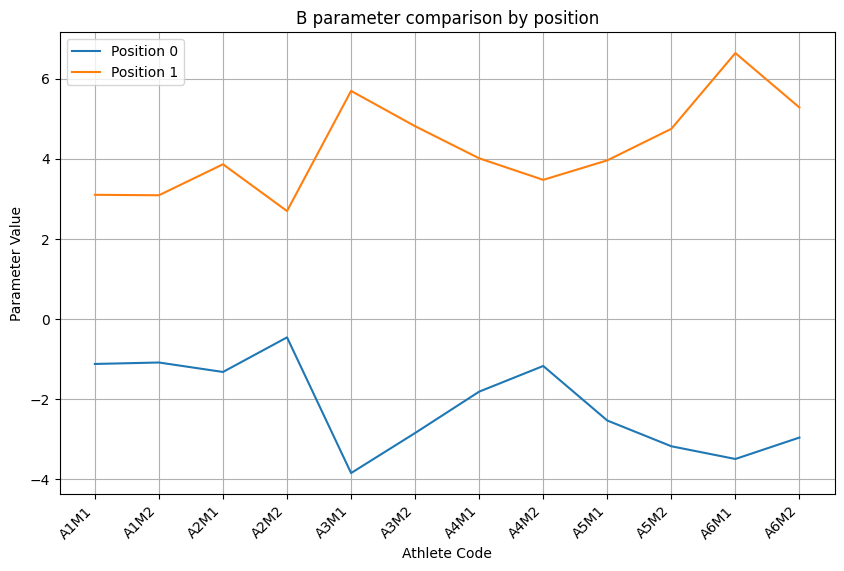

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Extract the 'b' parameter values and athlete codes
b_values = one_4_all['Parameters_b'].to_list()
athlete_codes = one_4_all['Athlete_Code'].to_list()

num_athletes = len(athlete_codes)
num_params = len(b_values[0])  # Assuming all athletes have the same number of 'b' parameters

# Create an array to store the parameter values for each position
param_positions = [[] for _ in range(num_params)]
for athlete_params in b_values:
    for i, param_value in enumerate(athlete_params):
        param_positions[i].append(param_value)

# Create the plot
plt.figure(figsize=(10, 6))  # Adjust figure size as needed

for i, position_values in enumerate(param_positions):
    plt.plot(athlete_codes, position_values, label=f"Position {i}")

# Customize the plot
plt.xlabel("Athlete Code")
plt.ylabel("Parameter Value")
plt.title("B parameter comparison by position")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.show()

In [21]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,1,1,3.0,1.0,1.0,1.0,0.722288,-9913.530782,33997.700448,6.243022e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
1,A1M2,1,1,1,3.0,1.0,1.0,1.0,0.804200,-7265.478476,16258.200534,1.705110e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
2,A2M1,3,4,1,3.0,1.0,1.0,1.0,0.709525,-9552.010572,34542.696412,6.677319e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
3,A2M2,3,4,0,3.0,1.0,1.0,1.0,0.726973,-5770.705147,20526.231224,4.416951e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
4,A3M1,1,1,4,5.0,1.0,3.0,1.0,0.769506,-8639.758298,23883.641210,3.389779e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
5,A3M2,1,3,3,3.0,1.0,1.0,1.0,0.883155,-9910.707407,16531.451194,1.645240e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
6,A4M1,3,4,0,3.0,1.0,1.0,1.0,0.605469,-6328.062712,34093.618148,1.004757e+06,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
7,A4M2,3,4,0,3.0,1.0,1.0,1.0,0.631495,-4879.669261,25366.690850,8.584501e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
8,A5M1,3,1,3,3.0,1.0,1.0,1.0,0.862438,-13518.725705,32476.977362,7.950670e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
9,A5M2,1,4,3,3.0,1.0,1.0,1.0,0.767969,-7146.870774,21221.631477,3.702689e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."


In [22]:
one_4_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,2,0,159.137013,-80.249100,-9714.739019,0.715137,9.092996,34203.446498,6.405421e+05,[0.9876161202412641],"[-1.126606594455808, 3.0973402266176726]"
1,A1M2,1,2,0,126.531391,-62.888709,-7070.118165,0.795520,6.317275,16459.963300,1.781493e+05,[0.9842246494978669],"[-1.090307582394874, 3.0863846288538332]"
2,A2M1,1,2,0,143.682432,-56.213342,-8841.284436,0.681111,9.725969,35245.309409,7.328236e+05,[0.982367925707955],"[-1.3266942696185609, 3.8601135938988658]"
3,A2M2,1,2,0,189.671076,-84.550536,-5400.713517,0.702640,10.377003,20885.010972,4.806938e+05,[0.9882424207505923],"[-0.46253168236010284, 2.692604391758069]"
4,A3M1,1,2,0,144.435236,-77.959261,-7132.891273,0.702226,8.622384,25417.350064,4.385643e+05,[0.9872547057214746],"[-3.8514928418954417, 5.69236243487436]"
5,A3M2,1,2,0,154.268093,-78.224008,-8652.283686,0.846256,6.842124,17810.129831,2.167521e+05,[0.9872975666173881],"[-2.85101861035034, 4.8105987838713995]"
6,A4M1,1,2,0,168.738422,-76.501230,-5252.817617,0.537438,13.129390,35152.630516,1.176845e+06,[0.9870133781440189],"[-1.8179498335480364, 4.009291915859838]"
7,A4M2,1,2,0,182.146499,-78.887063,-4479.816848,0.599374,13.775616,25750.897686,9.317597e+05,[0.9874036567906999],"[-1.1769583083308928, 3.471338124611437]"
8,A5M1,1,2,0,225.543030,-158.444814,-12778.087155,0.846526,11.397564,33222.921855,8.868582e+05,[0.993708528998255],"[-2.5388071165275563, 3.957804551633064]"
9,A5M2,1,2,0,124.515497,-79.165850,-5654.619747,0.684718,10.124096,22730.212799,5.032623e+05,[0.9874477358679957],"[-3.1820156633230976, 4.744967067007703]"



Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.7151370788107558


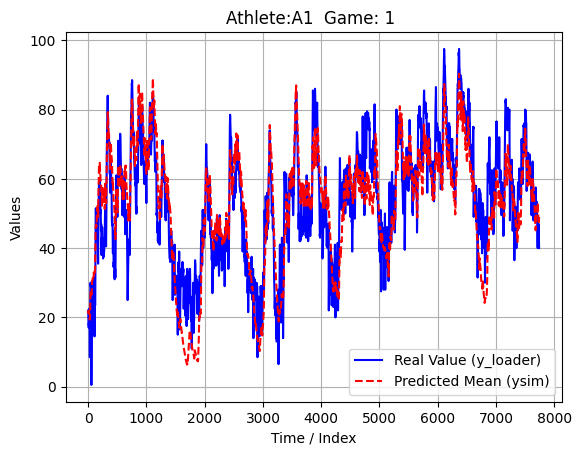


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.7955200529599864


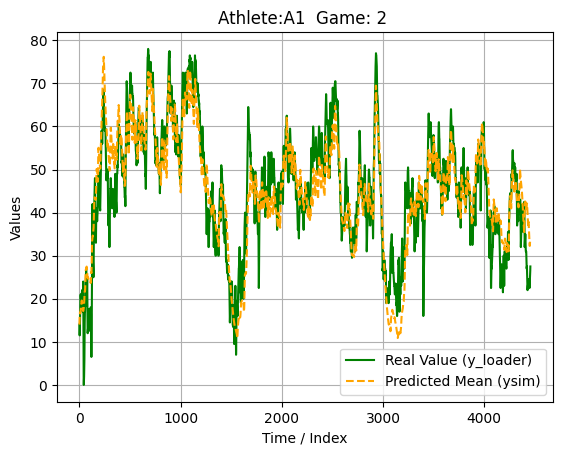

<ipython-input-23-0ca15153b7ea>:73: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)



Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.7955200529599864


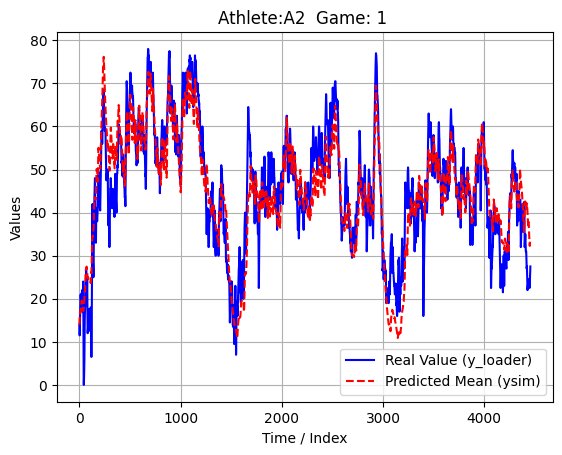


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.6811110453980813


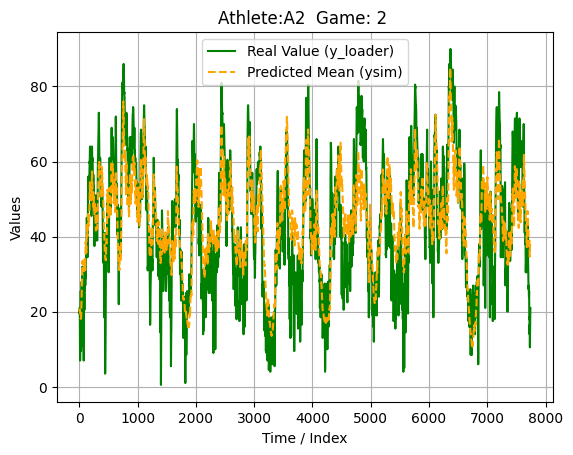


Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.6811110453980813


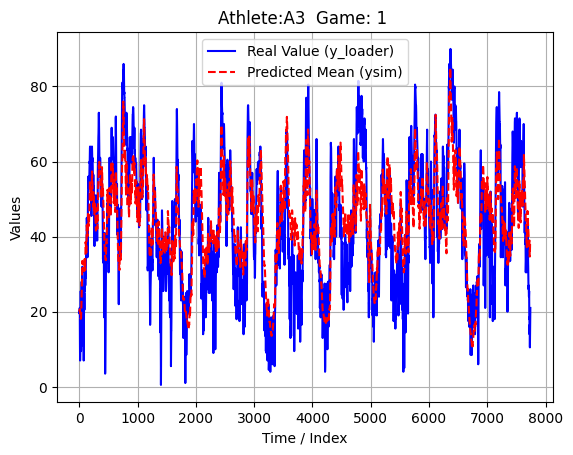


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.7026399147460015


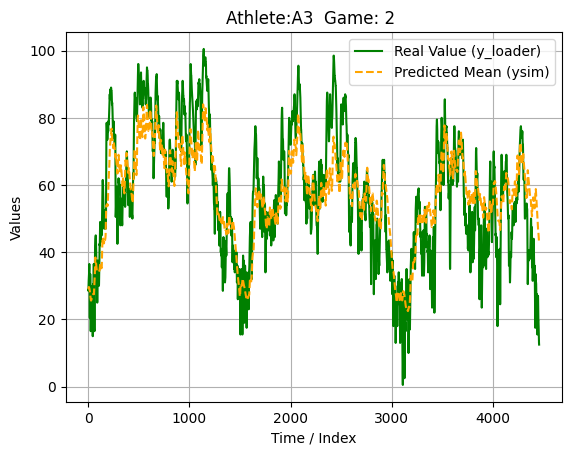


Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.7026399147460015


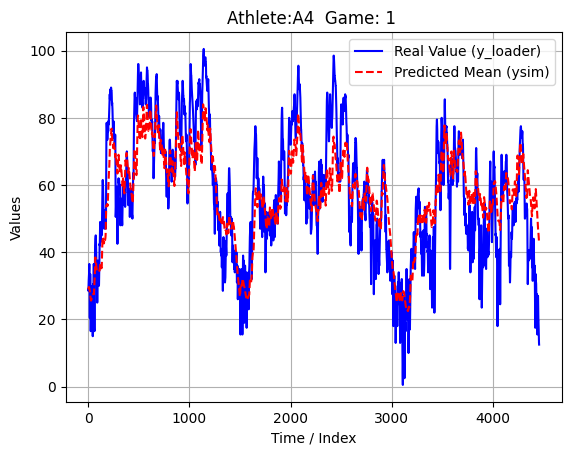


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.7022255172489347


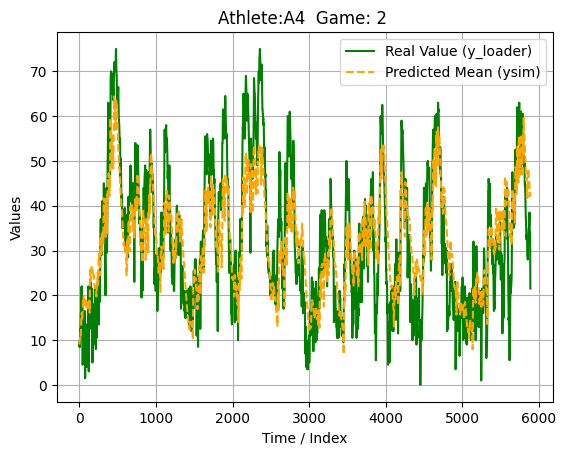


Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.7022255172489347


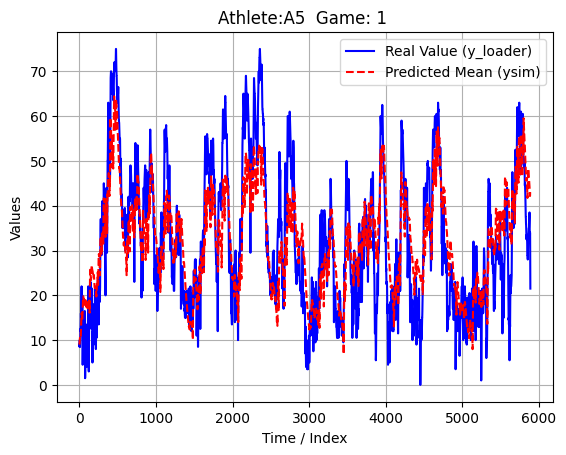


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.8462559688927636


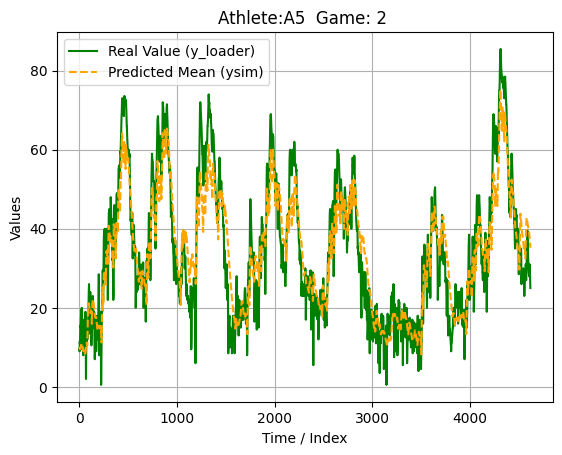


Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.8462559688927636


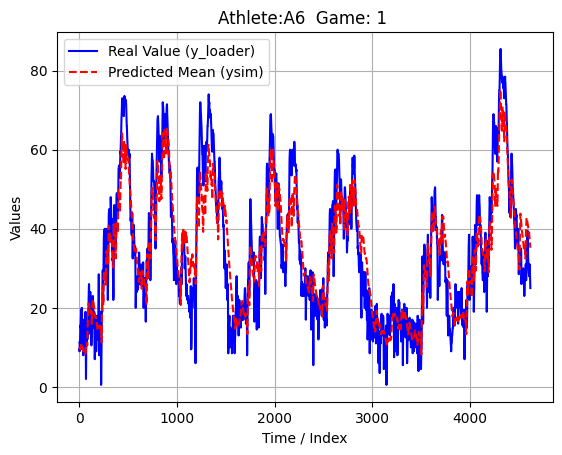


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.5374379556280356


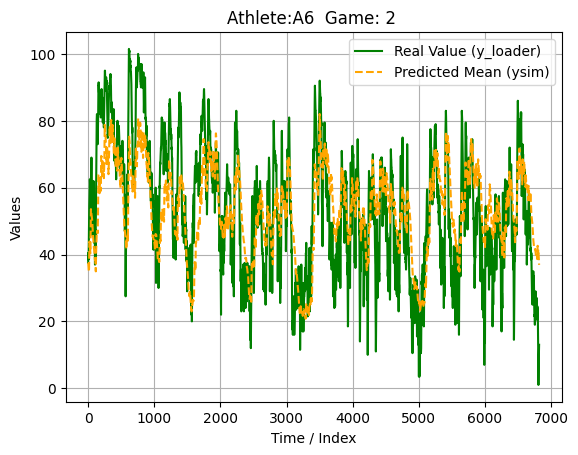

In [23]:
# Biological interpretation

#First Order Model
##
#  Code Here
##


#Second Order Model
##
#  Code Here
##




#Athlete Average Moder
#structure: 1:2:0
#for p_case in best_models_df.iterrows():
counter = 0
number_a=1
number_b=2
d=0
athlete_mean_model = pd.DataFrame(columns=['Athlete', 'Parameters_a', 'Parameters_b', 'Rsq_M1', 'AIC_M1', 'Rsq_M2', 'AIC_M2'])

for pcase in one_4_all.iterrows():
  #print(pcase)

  if pcase[1]["Athlete_Code"][3] == '1':    #First Game
    params_a_memory = pcase[1]['Parameters_a']
    params_b_memory = pcase[1]['Parameters_b']
    counter += 1

  else: #second game
    mean_a = (params_a_memory + pcase[1]['Parameters_a']) / 2
    mean_b = (params_b_memory + pcase[1]['Parameters_b']) / 2

    #Simulation
    #Simulation for first Game
    y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared1, aic1, Rmse1, bic1, fpe1 = model_generator(athlete_list[counter-1], number_a, number_b, d)

    ## Simulate values of Y
    #Plot Simulation
    print("Game1:",r_squared1)
    plt.plot(y_loader, label='Real Value (y_loader)', color='blue')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='red', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 1 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    plt.show()


      ##Simulation for Second Game
    X_loader, y_loader = dataloader(athlete_list[counter], number_a, number_b, d)
    y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared2, aic2, Rmse2, bic2, fpe2 = model_generator(athlete_list[counter], number_a, number_b, d)

    #Plot Simulation
    print("Game2:",r_squared2)
    plt.plot(y_loader, label='Real Value (y_loader)', color='green')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='orange', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 2 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    plt.show()


    #Save to the Dataframe
    new_row = pd.DataFrame({'Athlete': [pcase[1]['Athlete_Code'][:2]],'Parameters_a':[mean_a], 'Parameters_b':[mean_b], 'Rsq_M1':[r_squared1], 'AIC_M1':[aic1], 'Rsq_M2':[r_squared2], 'AIC_M2':[aic2]})
    athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)
    plt.show()







In [24]:
athlete_mean_model

,Athlete,Parameters_a,Parameters_b,Rsq_M1,AIC_M1,Rsq_M2,AIC_M2
0,A1,[0.9859203848695655],"[-1.1084570884253409, 3.091862427735753]",0.715137,-9714.739019,0.795520,-7070.118165
1,A2,[0.9853051732292737],"[-0.8946129759893319, 3.2763589928284675]",0.795520,-7070.118165,0.681111,-8841.284436
2,A3,[0.9872761361694313],"[-3.351255726122891, 5.25148060937288]",0.681111,-8841.284436,0.702640,-5400.713517
3,A4,[0.9872085174673594],"[-1.4974540709394646, 3.7403150202356374]",0.702640,-5400.713517,0.702226,-7132.891273
4,A5,[0.9905781324331253],"[-2.8604113899253267, 4.351385809320384]",0.702226,-7132.891273,0.846256,-8652.283686
5,A6,[0.9798249585157284],"[-3.232277656521976, 5.957947913614738]",0.846256,-8652.283686,0.537438,-5252.817617


 # Time-varying dynamics

In the lines bellow we consider that the parameter could change in time. This allows the moddels to have different values,depending on the time, allowing the model to better explain/predict the system behavior.


*   List item
*   List item



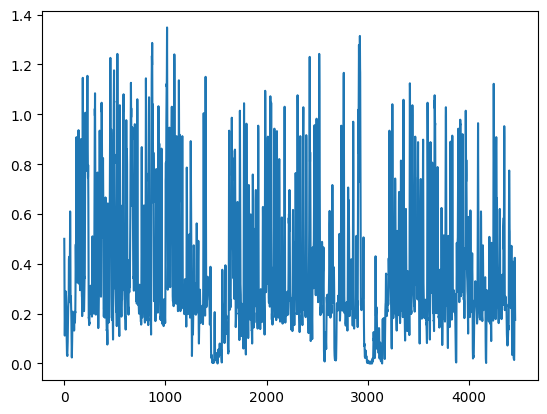

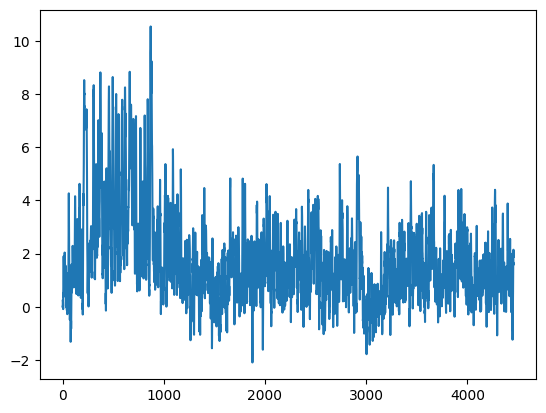

In [25]:
na = 2
nb = 1
d = 1

#INCORPORATE ASSIGNMENT DATA
X_loader, y_loader = dataloader(athlete_list[1], na, nb, d)
N = len(y_loader)
y = y_loader#.values.reshape(-1,1)
u = X_loader['u-{}'.format(d)].values.reshape(-1,1)

N = len(y_loader)
t = np.arange(N)                                        # example for 'time'/points 0-(N-1)
f = 2 * np.pi / 40                                      # f = chosen frequence for square wave


e = np.random.randn(N, 1) * np.sqrt(0.16)               # Noise vector e-N(0,0.16), 'standard normal distribution'is mean 0, standard deviation 1.
a1 = np.ones((N,1)) * -1                                # a1 = constant
a2 = np.ones((N,1)) * 0.25                              # a2 = constant (if you have a2 means it is second order system)
b0 = np.ones((N,1))
b0[200:899] = 2                                         # b0 = variable
# delay = 1


y = np.zeros((N,1))                                     # start with an empty vector for y
for k in range(max(na, nb+d-1), N):
    y[k] = -a1[k] * y[k-1] - a2[k] * y[k-2] + b0[k] * u[k-d] + e[k]  # if we have a2 means it is a second order system.

plt.plot(u)
plt.show()
plt.plot(y)

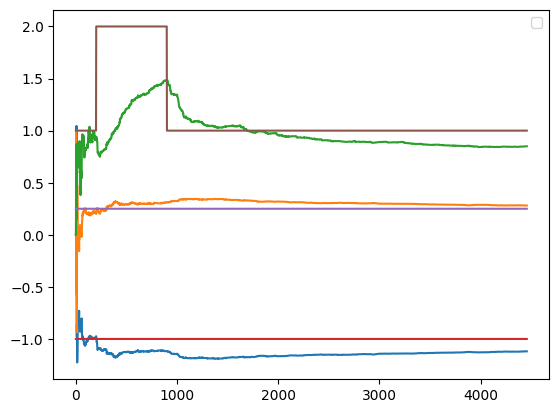

R2: 0.5758658711314688


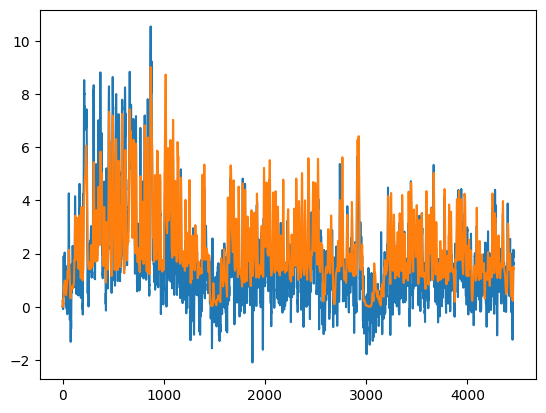

In [26]:
# Time-variant - recursive ARX

dm = 3                              # Number of parameters to estimate
# Initialise matrix
X = np.zeros((dm,1))              # prepare an input matrix that can be used in the loop, size is the number of parameters
P = 1000 * np.eye(dm)            # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))         # Minimum value to not create error in case of 0 division


# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))


# Loop over all the data
for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X[0] = - y[k-1]
    X[1] = - y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix g
    g = (P @ X) / (1 +( X.T @ P @ X))

    # 3. Update covariance matrix P
    P = P - g @ X.T @ P

    # 4. Re-estimate the parameter coefficients
    yhat =  X.T @ a_hat      # y = data vector * parameters vetor
    error = y[k] - yhat
    a_hat = a_hat + g * error
    # OR: a_hat = a_hat + g * ( y(k) - (X' * a_hat))

    # 5. Store estimates (get the diagonal elements of a_hat that correspond to a1, a2, b0)
    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]

# Simulate model (step 2)
ysim2 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim2[k] = - a1est[k] * ysim2[k-1] - a2est[k] * ysim2[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.legend()
plt.show()

plt.plot(y)
plt.plot(ysim2)

print('R2:',r_2(y, ysim2))


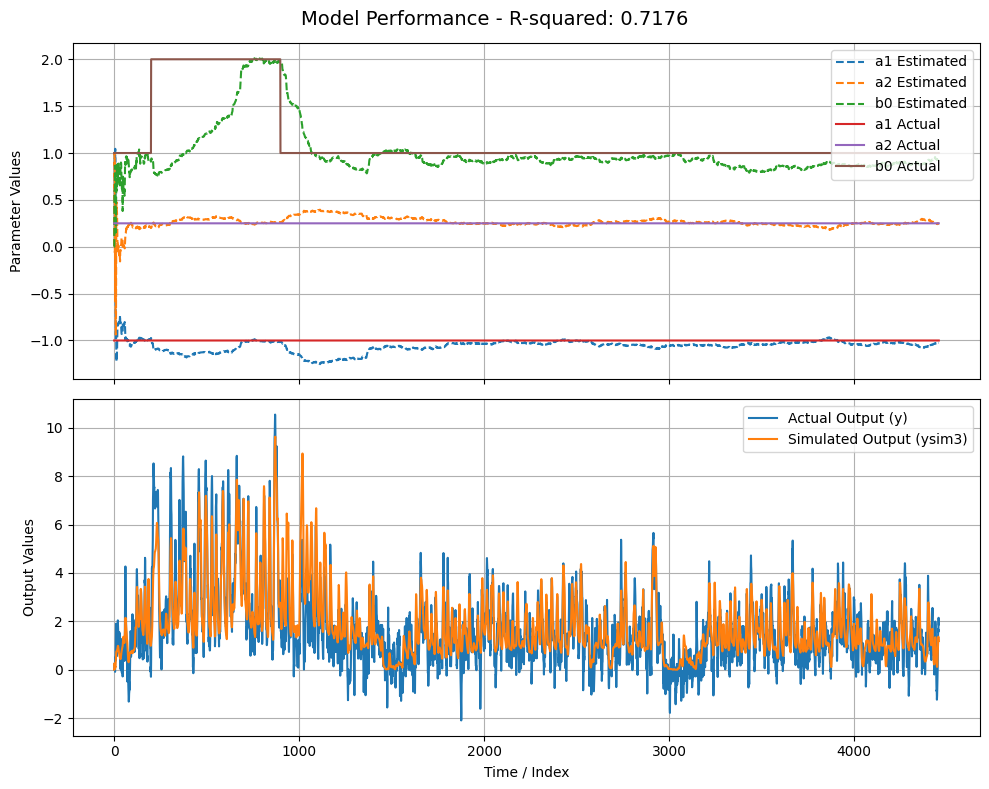

R2: 0.717597019476685


In [27]:
#Time-variant - recursive ARX RDW (rectancular data weighing)
Win = 500;                  # window size
# Initialise matrix
X_add = np.zeros((dm,1))
X_remove = np.zeros((dm,1))
P = 1000 * np.eye(dm)             # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
A_hat = np.ones((dm,1))           # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X_add[0] = -y[k-1]
    X_add[1] = -y[k-2]
    X_add[2] = u[k-1]

    # 2. Update gain matrix
    g = P @ X_add / (1 + X_add.T @ P @ X_add)  # inverse of matrix is 'devision'

    # 3. Update covariance matrix P
    P = P - g @ X_add.T @ P

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X_add.T @ A_hat
    error = y[k] - yhat
    A_hat = A_hat + g * error

    # 5 Remove effect of old data every data at (k-s)th instant
    if k - Win - max(nb + d - 1, na) > 0:
        # 5.a Update the matrix X(k-s) with the new data
        X_remove[0] = -y[k - Win - 1] #a1
        X_remove[1] = -y[k - Win - 2] #a2
        X_remove[2] = u[k - Win - d] #b0
        # 5.b Update gain matrix
        g = -P @ X_remove / (1 + X_remove.T @ P @ X_remove)
        # 5.c Update covariance matrix P
        P = (P - g @ X_remove.T @ P)
        # 5.d Re-estimate the parameter coefficients based on the new data
        yhat = X_remove.T @ A_hat
        error = y[k - Win] - yhat
        A_hat = A_hat + g * error

    a1est[k] = A_hat[0]
    a2est[k] = A_hat[1]
    b0est[k] = A_hat[2]

# Simulate model (step 3)
ysim3 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim3[k] = -a1est[k] * ysim3[k-1] - a2est[k] * ysim3[k-2] + b0est[k] * u[k-d]






# Create a figure with subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)  # 2 rows, 1 column

# Plot estimated and actual parameters in the first subplot
axes[0].plot(a1est, label='a1 Estimated', linestyle='--')
axes[0].plot(a2est, label='a2 Estimated', linestyle='--')
axes[0].plot(b0est, label='b0 Estimated', linestyle='--')
axes[0].plot(a1, label='a1 Actual')
axes[0].plot(a2, label='a2 Actual')
axes[0].plot(b0, label='b0 Actual')
axes[0].set_ylabel('Parameter Values')
axes[0].legend(loc='upper right')  # Add legend to the first subplot
axes[0].grid(True)

# Plot actual and simulated output in the second subplot
axes[1].plot(y, label='Actual Output (y)')
axes[1].plot(ysim3, label='Simulated Output (ysim3)')
axes[1].set_xlabel('Time / Index')
axes[1].set_ylabel('Output Values')
axes[1].legend(loc='upper right')  # Add legend to the second subplot
axes[1].grid(True)

# Calculate R-squared and add to the title
r_squared = r_2(y, ysim3)  # Assuming r_2 is your R-squared function
fig.suptitle(f'Model Performance - R-squared: {r_squared:.4f}', fontsize=14)

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

print('R2:',r_2(y, ysim3))




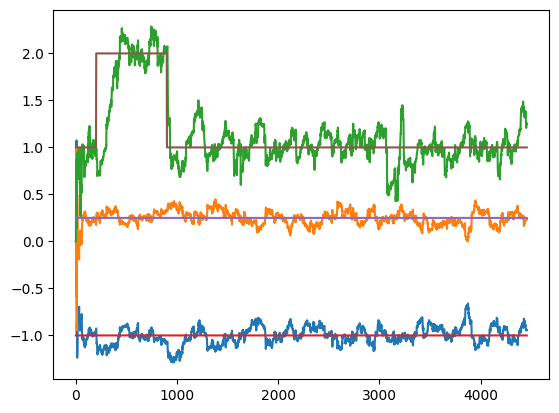

R2: 0.8086715972049078


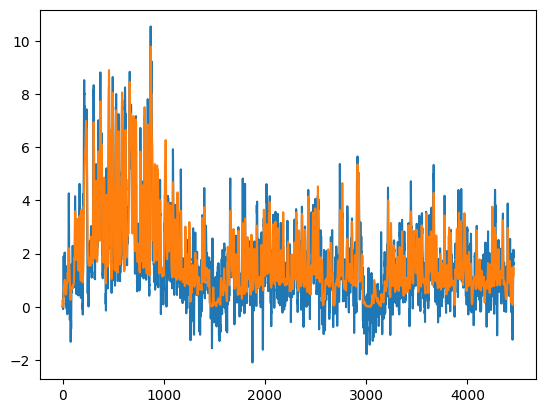

In [28]:
#Step 4 - Time-varying recursive ARX with EWP (exponentially weighted past)
Alpha = 0.985

# Initialise matrix
X = np.zeros((dm,1))
P = 1000 * np.eye(dm)         # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))       # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

#Loop over all the data
for k in range(max(na, nb+d-1), N):

    # 1. Update the matrix X with the new data
    X[0] = -y[k-1]
    X[1] = -y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix
    g = P @ X / (Alpha + X.T @ P @ X)

    # 3. Update covariance matrix P
    P = (P - g @ X.T @ P) / Alpha

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X.T @ a_hat
    error = y[k] - yhat
    a_hat = a_hat + g * error

    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]


# Simulate model
ysim4 = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    ysim4[k] = -a1est[k] * ysim4[k-1] - a2est[k] * ysim4[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.show()
plt.plot(y)
plt.plot(ysim4)

print('R2:',r_2(y, ysim4))


In [29]:
#2ºSystem Identification
def calcmodel(data, na, nb, d):
    # Load the associated data using dataloader(data, na, nb, d)

    X_loader, y_loader = dataloader(data, na, nb, d)


    # Estimate the a and b parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
    params = np.linalg.inv(X_loader.T @ X_loader) @ X_loader.T @ y_loader
    #params = np.linalg.solve(X_loader.T, X_loader) @ X_loader.T @ y_loader
    params = params.values


    parameters_a = params[:na]
    parameters_b = params[na:]


    # Optional: Calculate the predicted values of Y via Matrix-Vector multiplication (this is for prediction, not simulation)
    Y_pred = np.dot(X_loader, params)


    #Calculate a simulation using the predicted parameters use the following structure:
    ysim = np.zeros((len(X_loader)+1,1))  # the plus one is because the first value is initialized and not simulated

    ysim[0] = y_loader.values[0]    # initialize the first value
    max_lag = max(na, nb + d)  # Maximum lag across both endogenous and exogenous variables

    for k in range(max_lag, len(X_loader)):
        #Add the contribution from autoregressive terms (endogenous variables)
        for i_a in range(1, na + 1):
            #ysim[k] += parameters_a[i_a - 1] * ysim[k - i_a]
            ysim[k] += parameters_a[i_a - 1] * X_loader.iloc[k, i_a]

        #Add the contribution from exogenous input ter\ms (with delay d)
        for j_b in range(1, nb + 1):
            #ysim[k] += estimation[i_a - 1] * ysim[k - i_a - X_loader['u-{}'.format(d)]]                    #to get the column at delay u-d use this syntax X_loader['u-{}'.format(d)]
            ysim[k] += parameters_b[j_b-1] * X_loader['u-{}'.format(d)].iloc[k-j_b]


    # Calculate r-squared
    y_loader = y_loader.values.reshape(-1,1)
    SS_res = np.sum((y_loader - ysim[1:]) ** 2)  # Residual sum of squares
    SS_tot = np.sum((y_loader - np.mean(y_loader)) ** 2)  # Total sum of squares
    rsq = 1 - (SS_res / SS_tot)
    #print("ss_red:",SS_res,"ss_tot",SS_tot,"RSQ:",rsq)


    # Calculate AIC
    n = len(y_loader)  # Number of observations
    # Number of parameters (including intercept)
    aic =  2 * (na + nb) + len(y_loader) * np.log(1 - rsq) # Evaluates the complexicity of the Model


    return Y_pred, ysim, params, rsq, aic




#print(calcmodel(data,0,1,0))
#print(calcmodel(data,1,0,0))


In [30]:
pds = pd.DataFrame(columns=["Athlete", "na", "nb", "d", "Params", "RSQ", "AIC"])

# Parameter ranges
na_max = nb_max = xdelay_max = 3

for i in range(len(athlete_list)):
    print(f"Athlete: {code_name[i]}")


Athlete: A1M1
Athlete: A1M2
Athlete: A2M1
Athlete: A2M2
Athlete: A3M1
Athlete: A3M2
Athlete: A4M1
Athlete: A4M2
Athlete: A5M1
Athlete: A5M2
Athlete: A6M1
Athlete: A6M2


In [31]:
#3 Biological interpretation

# 2º Practical assignment

In [32]:
uploaded = files.upload()

Saving WildType_C6_Out.csv to WildType_C6_Out.csv
Saving WildType_C6_In.csv to WildType_C6_In.csv
Saving WildType_C5_Out.csv to WildType_C5_Out.csv
Saving WildType_C5_In.csv to WildType_C5_In.csv
Saving WildType_C4_Out.csv to WildType_C4_Out.csv
Saving WildType_C4_In.csv to WildType_C4_In.csv
Saving WildType_C3_Out.csv to WildType_C3_Out.csv
Saving WildType_C3_In.csv to WildType_C3_In.csv
Saving WildType_C2_Out.csv to WildType_C2_Out.csv
Saving WildType_C2_In.csv to WildType_C2_In.csv
Saving WildType_C1_Out.csv to WildType_C1_Out.csv
Saving WildType_C1_In.csv to WildType_C1_In.csv
Saving Unknown_C2_Out.csv to Unknown_C2_Out.csv
Saving Unknown_C2_In.csv to Unknown_C2_In.csv
Saving Unknown_C1_Out.csv to Unknown_C1_Out.csv
Saving Unknown_C1_In.csv to Unknown_C1_In.csv
Saving Mutation343_C6_Out.csv to Mutation343_C6_Out.csv
Saving Mutation343_C6_In.csv to Mutation343_C6_In.csv
Saving Mutation343_C5_Out.csv to Mutation343_C5_Out.csv
Saving Mutation343_C5_In.csv to Mutation343_C5_In.csv
Savi

In [33]:
M_334_df = pd.DataFrame()
M_343_df = pd.DataFrame()
WT_df = pd.DataFrame()
Unknown_df = pd.DataFrame()

# Mutant 334
for i in range(1,7):
  load_input = pd.read_csv('Mutation334_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Mutation334_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  M_334_df = pd.concat([M_334_df, load_input, load_output], axis=1)

# Mutant 343
for i in range(1,7):
  load_input = pd.read_csv('Mutation343_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Mutation343_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  M_343_df = pd.concat([M_343_df, load_input, load_output], axis=1)

# WildType
for i in range(1,7):
  load_input = pd.read_csv('WildType_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('WildType_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  WT_df = pd.concat([WT_df, load_input, load_output], axis=1)


# WildType
for i in range(1,3):
  load_input = pd.read_csv('Unknown_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Unknown_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  Unknown_df = pd.concat([Unknown_df, load_input, load_output], axis=1)

In [34]:

# Mutant 334

M334_C1_In_df = pd.read_csv('Mutation334_C1_In.csv', names=['u'])
M334_C2_In_df = pd.read_csv('Mutation334_C2_In.csv', names=['u'])
M334_C3_In_df = pd.read_csv('Mutation334_C3_In.csv', names=['u'])
M334_C4_In_df = pd.read_csv('Mutation334_C4_In.csv', names=['u'])
M334_C5_In_df = pd.read_csv('Mutation334_C5_In.csv', names=['u'])
M334_C6_In_df = pd.read_csv('Mutation334_C6_In.csv', names=['u'])

M334_C1_Out_df = pd.read_csv('Mutation334_C1_Out.csv', names=['y'])
M334_C2_Out_df = pd.read_csv('Mutation334_C2_Out.csv', names=['y'])
M334_C3_Out_df = pd.read_csv('Mutation334_C3_Out.csv', names=['y'])
M334_C4_Out_df = pd.read_csv('Mutation334_C4_Out.csv', names=['y'])
M334_C5_Out_df = pd.read_csv('Mutation334_C5_Out.csv', names=['y'])
M334_C6_Out_df = pd.read_csv('Mutation334_C6_Out.csv', names=['y'])

Mutant_334_list = [M334_C1_In_df,
M334_C2_In_df,
M334_C3_In_df,
M334_C4_In_df,
M334_C5_In_df,
M334_C6_In_df,
M334_C1_Out_df,
M334_C2_Out_df,
M334_C3_Out_df,
M334_C4_Out_df,
M334_C5_Out_df,
M334_C6_Out_df] #12

# Mutant 343

M343_C1_In_df = pd.read_csv('Mutation343_C1_In.csv', names=['u'])
M343_C2_In_df = pd.read_csv('Mutation343_C2_In.csv', names=['u'])
M343_C3_In_df = pd.read_csv('Mutation343_C3_In.csv', names=['u'])
M343_C4_In_df = pd.read_csv('Mutation343_C4_In.csv', names=['u'])
M343_C5_In_df = pd.read_csv('Mutation343_C5_In.csv', names=['u'])
M343_C6_In_df = pd.read_csv('Mutation343_C6_In.csv', names=['u'])

M343_C1_Out_df = pd.read_csv('Mutation343_C1_Out.csv', names=['y'])
M343_C2_Out_df = pd.read_csv('Mutation343_C2_Out.csv', names=['y'])
M343_C3_Out_df = pd.read_csv('Mutation343_C3_Out.csv', names=['y'])
M343_C4_Out_df = pd.read_csv('Mutation343_C4_Out.csv', names=['y'])
M343_C5_Out_df = pd.read_csv('Mutation343_C5_Out.csv', names=['y'])
M343_C6_Out_df = pd.read_csv('Mutation343_C6_Out.csv', names=['y'])

Mutant_343_list = [M343_C1_In_df,
M343_C2_In_df,
M343_C3_In_df,
M343_C4_In_df,
M343_C5_In_df,
M343_C6_In_df,
M343_C1_Out_df,
M343_C2_Out_df,
M343_C3_Out_df,
M343_C4_Out_df,
M343_C5_Out_df,
M343_C6_Out_df] #12

# WildType

WildType_C1_In_df = pd.read_csv('WildType_C1_In.csv', names=['u'])
WildType_C2_In_df = pd.read_csv('WildType_C2_In.csv', names=['u'])
WildType_C3_In_df = pd.read_csv('WildType_C3_In.csv', names=['u'])
WildType_C4_In_df = pd.read_csv('WildType_C4_In.csv', names=['u'])
WildType_C5_In_df = pd.read_csv('WildType_C5_In.csv', names=['u'])
WildType_C6_In_df = pd.read_csv('WildType_C6_In.csv', names=['u'])

WildType_C1_Out_df = pd.read_csv('WildType_C1_Out.csv', names=['y'])
WildType_C2_Out_df = pd.read_csv('WildType_C2_Out.csv', names=['y'])
WildType_C3_Out_df = pd.read_csv('WildType_C3_Out.csv', names=['y'])
WildType_C4_Out_df = pd.read_csv('WildType_C4_Out.csv', names=['y'])
WildType_C5_Out_df = pd.read_csv('WildType_C5_Out.csv', names=['y'])
WildType_C6_Out_df = pd.read_csv('WildType_C6_Out.csv', names=['y'])

WildType_list = [WildType_C1_In_df,
WildType_C2_In_df,
WildType_C3_In_df,
WildType_C4_In_df,
WildType_C5_In_df,
WildType_C6_In_df,
WildType_C1_Out_df,
WildType_C2_Out_df,
WildType_C3_Out_df,
WildType_C4_Out_df,
WildType_C5_Out_df,
WildType_C6_Out_df] #12

# Unknown

Unknown_C1_In_df = pd.read_csv('Unknown_C1_In.csv', names=['u'])
Unknown_C2_In_df = pd.read_csv('Unknown_C2_In.csv', names=['u'])

Unknown_C1_Out_df = pd.read_csv('Unknown_C1_Out.csv', names=['y'])
Unknown_C2_Out_df = pd.read_csv('Unknown_C2_Out.csv', names=['y'])

UnknownType_list = [Unknown_C1_In_df,
Unknown_C2_In_df,
Unknown_C1_Out_df,
Unknown_C2_Out_df] #4


In [35]:
M_343_df[118:150]

,u_C1,y_C1,u_C2,y_C2,u_C3,y_C3,u_C4,y_C4,u_C5,y_C5,u_C6,y_C6
118,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
119,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
120,1,0.000000,1,0.000000,1,0.000000,1,0.000000,1,0.000000,1,0.000000
121,1,-0.004476,1,-0.009410,1,-0.006017,1,-0.003728,1,0.008657,1,0.003526
122,1,0.010440,1,-0.003501,1,-0.028714,1,0.009216,1,0.005990,1,0.005962
123,1,0.017157,1,-0.000800,1,-0.017428,1,0.003781,1,0.015397,1,0.007693
124,1,0.023259,1,-0.002094,1,-0.006842,1,0.002913,1,0.021493,1,0.009630
125,1,0.040516,1,0.007420,1,0.028133,1,0.023213,1,0.034411,1,0.010388
126,1,0.051815,1,0.014941,1,0.052256,1,0.039290,1,0.056999,1,0.029036
127,1,0.047186,1,0.010044,1,0.059063,1,0.050468,1,0.065569,1,0.032477


In [36]:
for variation in [M_334_df, M_343_df, WT_df, Unknown_df]:
  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]
    #print(input, output)
    data = pd.concat([variation[input], variation[output]], axis=1)
    data2 = variation[[input, output]].copy()
    if (data.values == data2.values).all():
      continue
      #print('Inputs are all the Equal!')

data2

,u_C2,y_C2
0,0,0.000000
1,0,0.000000
2,0,0.000000
3,0,0.000000
4,0,0.000000
...,...,...
1281,1,-0.008968
1282,1,-0.010152
1283,1,-0.010319
1284,1,-0.014991


Inputs are all the Equal!
Inputs are all the Equal!
Inputs are all the Equal!


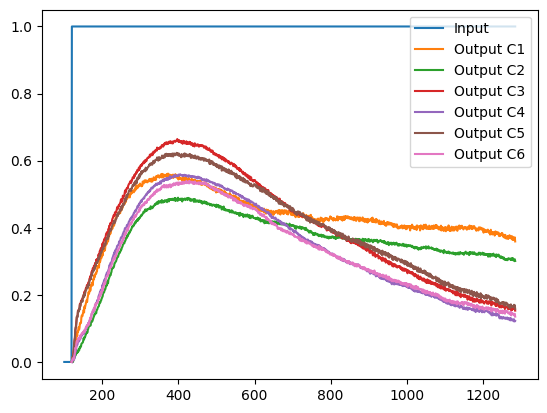

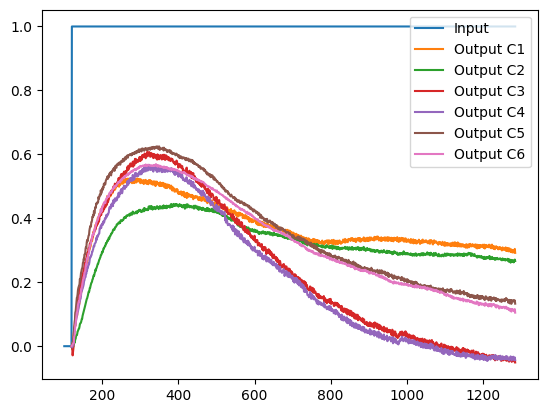

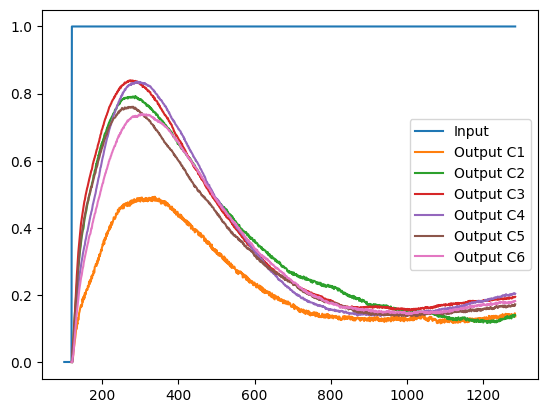

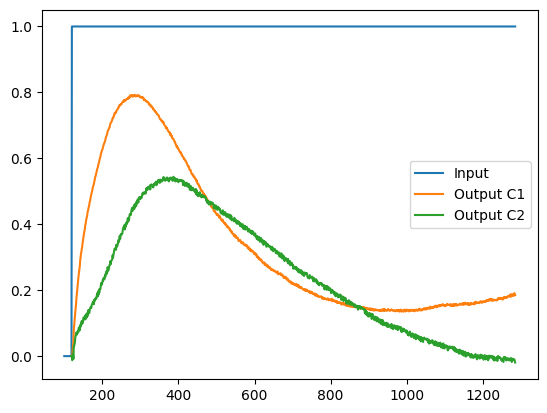

In [37]:
for variation in [M_334_df, M_343_df, WT_df]:
  i= 0
  if variation.iloc[:, i].all() == variation.iloc[:, i+2].all() == variation.iloc[:, i+4].all() == variation.iloc[:, i+6].all() == variation.iloc[:, i+8].all() == variation.iloc[:, i+10].all():
      print('Inputs are all the Equal!')



for variation in [M_334_df, M_343_df, WT_df, Unknown_df]:
  counter = 1
  #input = variation.iloc[119:, 0] # Access column by index using iloc
  #plt.plot(input, label='Input'.format(counter))
  input = variation.iloc[100:, 0] # Access column by index using iloc
  plt.plot(input, label='Input'.format(counter))
  for i in range(0,len(variation.columns),2): #0,2,..8,10 (6X)
    #variation.iloc[:, i] = variation.iloc[:, i] - variation.iloc[:, i].min()
    #variation.iloc[:, i] = variation.iloc[:, i] - variation.iloc[:, i].mean()
    #variation.iloc[:, i] = variation.iloc[:, i] / variation.iloc[:, i].std()

    output = variation.iloc[119:, i+1] # Access next column for output



    plt.plot(output, label='Output C{}'.format(counter))
    plt.legend()
    counter += 1
  plt.show()


code_name = ["M_334","M_343","WT","Unknown"]



In [38]:
#1ºData Preparation
#Pre-processing && Ploting
for lists in [Mutant_334_list,Mutant_343_list,WildType_list,UnknownType_list]:
  pds = pd.DataFrame(columns=['Input','Output'])


#Remove the first 119 values (0 or 1) for all the datasets and reset the index for 0
#all_datasets_df = [df.iloc[120:].reset_index(drop=True) for df in [M_334_df, M_343_df, WT_df, Unknown_df]]

#all_datasets_df = [[M_334_df, M_343_df, WT_df, Unknown_df]]    #Original Datasets


In [39]:
#Set values < 0 to eq 0

all_datasets_df = [M_334_df, M_343_df, WT_df, Unknown_df]
count = 0
for variation in all_datasets_df:
  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]

    for iter in range(len(variation[output])):
      value = variation[output][iter]
      if value < 0:
        #variation.loc[iter, output] = 0
        print(all_datasets_df[count][output][iter])
  count += 1


#all_datasets_df = [df.iloc[100:].reset_index(drop=True) for df in all_datasets_df]

-0.00036785
-0.00015048
-0.0015476
-0.0044761
-0.0094103
-0.0035007
-0.00080026
-0.0020942
-0.0060173
-0.028714
-0.017428
-0.0068417
-0.00090815
-0.0032643
-0.0026616
-0.003689
-0.0008773
-0.0031568
-0.0023999
-0.0024492
-0.002785
-0.0034828
-0.0031074
-0.0050856
-0.0092692
-0.0027506
-0.0091186
-0.0099891
-0.0045817
-0.0012809
-0.0079925
-0.0044372
-0.0156
-0.0090384
-0.013573
-0.0025418
-0.0076788
-0.011124
-0.0020255
-0.0090692
-0.0058549
-0.0016687
-0.0039631
-0.0077281
-0.0031974
-0.013038
-0.0065192
-0.00919
-0.014637
-0.012678
-0.009894
-0.0084665
-0.013296
-0.014616
-0.0028133
-0.011604
-0.017941
-0.0078922
-0.013786
-0.0070982
-0.020289
-0.015256
-0.015317
-0.013502
-0.016526
-0.02079
-0.010981
-0.015394
-0.016634
-0.021941
-0.0068673
-0.015124
-0.0059633
-0.0095135
-0.020557
-0.018575
-0.008701
-0.018061
-0.022356
-0.019744
-0.020735
-0.012319
-0.010224
-0.017687
-0.018443
-0.012445
-0.017163
-0.018455
-0.017875
-0.016992
-0.018044
-0.025992
-0.022663
-0.014198
-0.014137
-0.0

# 2. System identification

In [40]:
all_datasets_df = [df.iloc[119:] for df in [M_334_df, M_343_df, WT_df, Unknown_df]]
all_datasets_df[3]

,u_C1,y_C1,u_C2,y_C2
119,0,0.000000,0,0.000000
120,1,0.000000,1,0.000000
121,1,-0.001768,1,-0.012251
122,1,0.021867,1,0.003183
123,1,0.031156,1,0.006595
...,...,...,...,...
1281,1,0.188950,1,-0.008968
1282,1,0.186890,1,-0.010152
1283,1,0.191060,1,-0.010319
1284,1,0.184260,1,-0.014991


In [41]:
na_max = nb_max = xdelay_max = 5
model_count=0

all_datasets_df = [M_334_df, M_343_df, WT_df, Unknown_df]
final_results_df = pd.DataFrame(columns=['Code_Name','Model_Index','na','nb','d','AIC','Rsq','RMSE','BIC','FPE','Parameters_a','Parameters_b'])

##Loop through parameters
#Starts 1:1:0 .... 4,4,4               (1,na_max+1|1,nb_max+1|xdelay_max+1)(max=4)
#Starts 0:1:0 .... 3,4,4               (na_max|1,nb_max+1|xdelay_max+1)(max=4)
counter = nm_count = 0
for variation in all_datasets_df:
  print("Running: ",code_name[nm_count])
  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]
    data = pd.concat([variation[input].rename("u"), variation[output].rename("y")], axis=1)
    model_counter = 0

    for na in range(1,na_max+1):
      for nb in range(1,nb_max+1):
        for d in range(xdelay_max+1):
          #print(data)
          #Calculate Model
          y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, na, nb, d)

          #Save Results
          new_row = pd.DataFrame({'Code_Name': code_name[nm_count],'Model_Index': [model_counter], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b]})
          final_results_df = pd.concat([final_results_df, new_row], ignore_index=True)


          model_counter += 1
  nm_count += 1






Running:  M_334

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 5 time delay


<ipython-input-41-866edd81cfaa>:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_results_df = pd.concat([final_results_df, new_row], ignore_index=True)


Streaming output truncated to the last 5000 lines.
Model with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 5 time delay

Model with 2 a parameters, 5 b parameters and 0 time delay

Model with 2 a parameters, 5 b parameters and 1 time delay

Model with 2 a parameters, 5 b parameters and 2 time delay

Model with 2 a parameters, 5 b parameters and 3 time delay

Model with 2 a parameters, 5 b parameters and 4 time delay

Model with 2 a parameters, 5 b parameters and 5 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 5 time delay

Model with 3 a parameters, 2 b parameters and 0 t

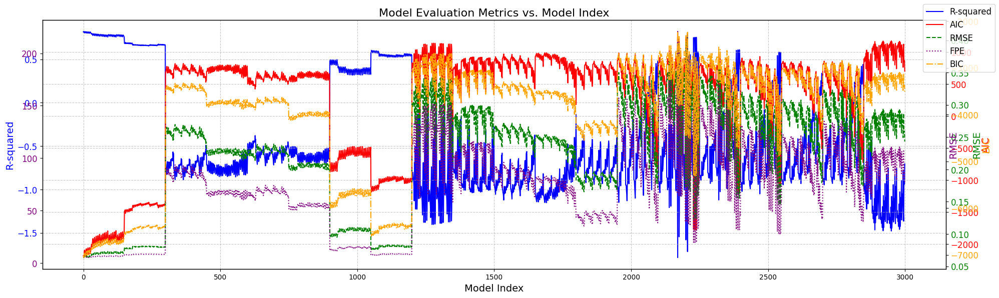

In [42]:
#Plot for each player/game
fig, ax1 = plt.subplots(figsize=(20, 6))
X_axis = np.arange(len(final_results_df)) #results_df['Model_Index']

#For R-square Error
ax1.plot(X_axis, final_results_df['Rsq'], color='blue', label='R-squared')
ax1.set_xlabel('Model Index', fontsize=14)  # Increased font size
ax1.set_ylabel('R-squared', color='blue', fontsize=14)  # Increased font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

#For AIC
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(X_axis, final_results_df['AIC'], color='red', label='AIC')
ax2.set_ylabel('AIC', color='red', fontsize=14)  # Increased font size
ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size

#For RMSE
ax3 = ax1.twinx()
ax3.plot(X_axis, final_results_df['RMSE'], color='green', label='RMSE', linestyle='--')
ax3.set_ylabel('RMSE', color='green', fontsize=14)
ax3.tick_params(axis='y', labelcolor='green', labelsize=12)

#For FPE
ax4 = ax1.twinx()
ax4.plot(X_axis, final_results_df['FPE'], color='purple', label='FPE', linestyle=':')
ax4.set_ylabel('RMSE', color='purple', fontsize=14)
ax4.tick_params(axis='y', labelcolor='purple', labelsize=12)

#For BIC
ax5 = ax4.twinx()
ax5.plot(X_axis, final_results_df['BIC'], color='orange', label='BIC', linestyle='-.')
ax5.set_ylabel('BIC', color='orange', fontsize=14)
ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)

# General graphic configs
fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
plt.title('Model Evaluation Metrics vs. Model Index', fontsize=16)  # Added title with increased font size
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()

In [43]:
final_results_df

,Code_Name,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,M_334,0,1,1,0,-2181.781631,0.817499,0.064630,-7025.106214,5.384242,[0.9890240206821521],[0.005014160227500306]
1,M_334,1,1,1,1,-2195.185670,0.819633,0.064110,-7040.374873,5.293839,[0.9887981709601034],[0.005115382036030049]
2,M_334,2,1,1,2,-2210.868721,0.822062,0.063536,-7057.957893,5.195439,[0.9885461046149534],[0.005228353666433904]
3,M_334,3,1,1,3,-2123.838670,0.809819,0.065539,-6972.863603,5.523886,[0.9890002315196553],[0.005024818407645203]
4,M_334,4,1,1,4,-2103.133734,0.806971,0.065880,-6954.130674,5.577127,[0.988994535312947],[0.005027517604346653]
...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Unknown,145,5,5,1,1122.194064,-1.365736,0.286674,-3126.941938,106.849559,"[0.49788737993746834, 0.33475150234482887, 0.1...","[-0.012251000000081487, 0.02153351829070067, -..."
2996,Unknown,146,5,5,2,847.486949,-0.909764,0.257535,-3398.641753,86.165809,"[0.5075791373370594, 0.3218912178769518, 0.191...","[0.009401252012038182, -0.0004787363483330267,..."
2997,Unknown,147,5,5,3,848.801667,-0.912698,0.257698,-3394.321940,86.208327,"[0.4896891061636075, 0.3356833321988337, 0.190...","[0.009148425042662172, -0.01963328847893805, 0..."
2998,Unknown,148,5,5,4,866.478301,-0.940343,0.259518,-3373.642423,87.363060,"[0.4857351842630541, 0.32311929741515966, 0.20...","[-0.01025607575895384, 0.04228095814696398, -0..."


In [44]:
final_results_df.sort_values(by='Rsq', ascending=False)[:50]

,Code_Name,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
2,M_334,2,1,1,2,-2210.868721,0.822062,0.063536,-7057.957893,5.195439,[0.9885461046149534],[0.005228353666433904]
7,M_334,7,1,2,1,-2195.049662,0.820135,0.063879,-7036.981877,5.259894,[0.9885461046148104],"[-0.0003678499999680653, 0.0055962036664203236]"
1,M_334,1,1,1,1,-2195.185670,0.819633,0.064110,-7040.374873,5.293839,[0.9887981709601034],[0.005115382036030049]
12,M_334,12,1,3,0,-2180.303551,0.818339,0.064197,-7017.078810,5.320697,[0.9885461046149548],"[1.2282245727513205e-13, -0.000367850000048876..."
8,M_334,8,1,2,2,-2180.369934,0.818307,0.064060,-7024.238691,5.285596,[0.9890008303292618],"[0.01490780395549192, -0.00988324295421771]"
6,M_334,6,1,2,0,-2181.328039,0.817960,0.064407,-7021.359507,5.351282,[0.9887981709600799],"[4.086404787884136e-14, 0.005115382036038086]"
0,M_334,0,1,1,0,-2181.781631,0.817499,0.064630,-7025.106214,5.384242,[0.9890240206821521],[0.005014160227500306]
14,M_334,14,1,3,2,-2170.467536,0.817426,0.064071,-7011.153683,5.291546,[0.9889874795916405],"[0.014907799044416501, -0.010171632947592385, ..."
20,M_334,20,1,4,2,-2163.544639,0.816966,0.064006,-7001.086446,5.285046,[0.9888927847887701],"[0.014907764210855112, -0.01017022087309322, -..."
13,M_334,13,1,3,1,-2166.217460,0.816576,0.064364,-7004.930040,5.344269,[0.9890008303288299],"[-0.0003678499999252438, 0.015275653955519697,..."


In [45]:
#Select Best Models
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(final_results_df[['AIC', 'Rsq', 'FPE', 'BIC', 'RMSE']])
# Create a new DataFrame with the normalized metrics
normalized_df = pd.DataFrame(normalized_metrics, columns=['AIC_norm', 'Rsq_norm', 'FPE_norm', 'BIC_norm', 'RMSE_norm'])
selection_df = pd.concat([final_results_df, normalized_df], axis=1)


best_models_df = pd.DataFrame()


num_models = na_max*nb_max*(xdelay_max+1) # 5X5X6
cases = len(final_results_df)/(num_models) #3000 / 150 = 20

#LOOP for each case (models)
for i in range(int(cases)): #0,1..19
  print("Case: ",i,"Start: ",(i*num_models),"End: ",(i+1)*num_models)
  #Select each dataset models data
  selected_df = selection_df[(i*num_models):(i+1)*num_models].copy()

  #Create a Ranking Selection
  selected_df['AIC_rank'] = selected_df['AIC'].rank()
  selected_df['BIC_rank'] = selected_df['BIC'].rank()

  # Rank by Rsq
  selected_df['Rsq_rank'] = selected_df['Rsq'].rank(ascending=True)  # Note: ascending=False for Rsq

  # Calculate the combined ranking
  selected_df['Ranking'] = selected_df['Rsq_rank'] + selected_df['AIC_rank']#+ selected_df['BIC_rank']
  best_df = selected_df.sort_values(by='Ranking', ascending=True).iloc[0]

  new_row = pd.DataFrame({'Code_Name': [best_df['Code_Name']],
                          'na': [best_df['na']],
                          'nb': [best_df['nb']],
                          'd': [best_df['d']],
                          'Ranking': [best_df['Ranking']],
                          'AIC_rank': [best_df['AIC_rank']],
                          'Rsq_rank': [best_df['Rsq_rank']],
                          'BIC_rank': [best_df['BIC_rank']],
                          'Rsq': [best_df['Rsq']],
                          'AIC': [best_df['AIC']],
                          'BIC': [best_df['BIC']],
                          'FPE': [best_df['FPE']],
                          'Parameters_a':[best_df['Parameters_a']],
                          'Parameters_b':[best_df['Parameters_b']]})

  #Save new model
  best_models_df = pd.concat([best_models_df, new_row], ignore_index=True)

  #print(selected_df.sort_values(by='Rsq', ascending=False)[:3])
  #print(selected_df.sort_values(by='AIC', ascending=True)[:3])
  #print(selected_df.sort_values(by='FPE', ascending=True)[:3])

Case:  0 Start:  0 End:  150
Case:  1 Start:  150 End:  300
Case:  2 Start:  300 End:  450
Case:  3 Start:  450 End:  600
Case:  4 Start:  600 End:  750
Case:  5 Start:  750 End:  900
Case:  6 Start:  900 End:  1050
Case:  7 Start:  1050 End:  1200
Case:  8 Start:  1200 End:  1350
Case:  9 Start:  1350 End:  1500
Case:  10 Start:  1500 End:  1650
Case:  11 Start:  1650 End:  1800
Case:  12 Start:  1800 End:  1950
Case:  13 Start:  1950 End:  2100
Case:  14 Start:  2100 End:  2250
Case:  15 Start:  2250 End:  2400
Case:  16 Start:  2400 End:  2550
Case:  17 Start:  2550 End:  2700
Case:  18 Start:  2700 End:  2850
Case:  19 Start:  2850 End:  3000


In [46]:
best_models_df

,Code_Name,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,M_334,3,1,0,139.0,69.0,70.0,65.0,0.780376,-1936.820178,-6773.595437,6.432614,"[0.43089029407073476, 0.27459453607181084, 0.2...",[0.008119728192081229]
1,M_334,2,1,2,124.0,62.0,62.0,46.0,0.664288,-1394.394959,-6433.510148,8.418829,"[0.5970639611462832, 0.3942760813426738]",[0.0035213140944162584]
2,M_334,1,2,1,143.0,36.0,107.0,20.0,-0.679434,671.179897,-3483.577332,83.907662,[0.998210717485509],"[0.008307299999929879, -0.007465278756850775]"
3,M_334,2,1,4,142.0,122.0,20.0,104.0,-0.824337,776.158390,-3728.495490,68.903681,"[0.7664979231679454, 0.23189992979911364]",[0.0006507543660205134]
4,M_334,1,2,4,140.0,81.0,59.0,58.0,-0.586191,596.509306,-3741.721567,67.986847,[0.9976754030512157],"[0.0014252468015774483, -0.0003813493216661117]"
5,M_334,1,1,3,138.0,42.0,96.0,20.0,-0.595657,603.060371,-4057.702236,53.677737,[0.9981683923625312],[0.0007040541646341949]
6,M_343,3,2,2,142.0,57.0,85.0,55.0,0.388499,-620.536682,-5736.472521,14.316880,"[0.4965310557182847, 0.2711475612890417, 0.217...","[0.01266252265859954, -0.006744066106960133]"
7,M_343,2,1,0,135.0,112.0,23.0,91.0,0.535836,-979.493149,-6385.879772,8.778083,"[0.5969507481049563, 0.3925657401613831]",[0.003757825327818159]
8,M_343,2,3,1,148.0,138.0,10.0,136.0,-1.379500,1121.353719,-2726.201274,149.836504,"[0.6207919369339903, 0.3790426772820538]","[-0.00601729999998946, -0.01896120867778952, 0..."
9,M_343,2,1,0,145.0,99.0,46.0,87.0,-0.942605,858.614357,-3137.771318,110.160410,"[0.587169217104652, 0.41275178117932176]",[-3.257127893430118e-05]



Model with 3 a parameters, 1 b parameters and 0 time delay
0       0.000000
1       0.000000
2       0.000000
3       0.000000
4       0.000000
          ...   
1278   -0.097272
1279   -0.092602
1280   -0.092832
1281   -0.089732
1282   -0.101922
Name: y, Length: 1283, dtype: float64


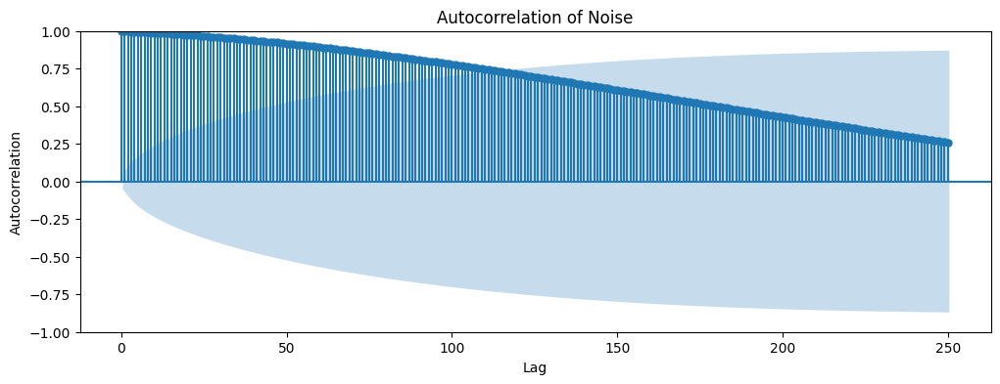

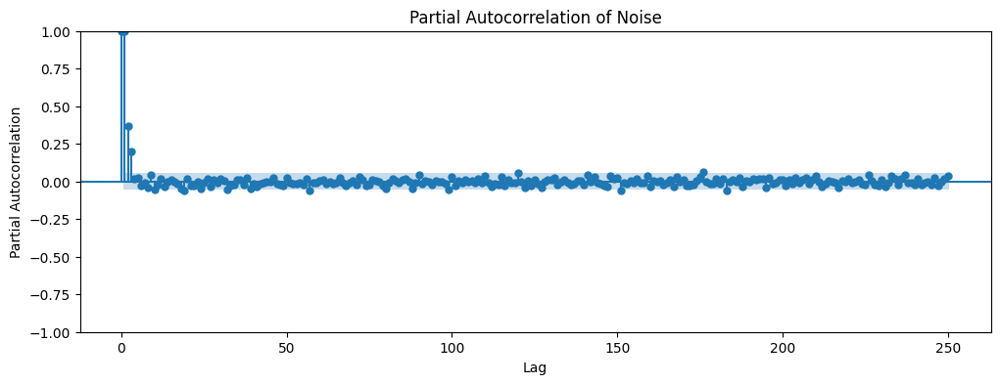

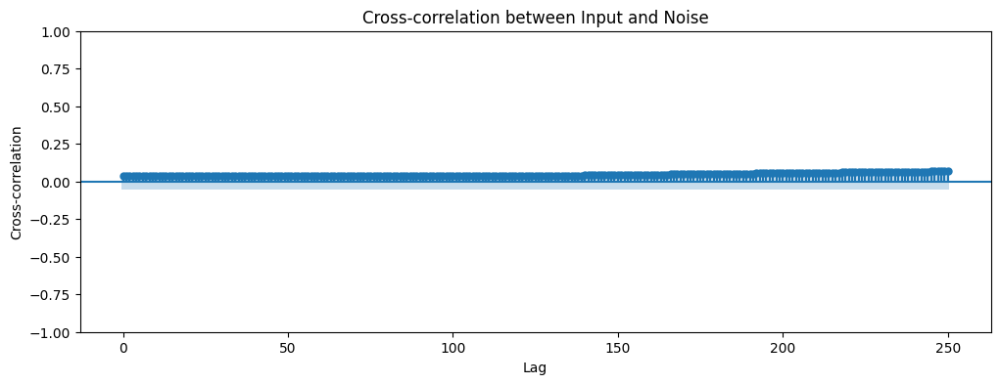

[   0    1    2 ... 1280 1281 1282]


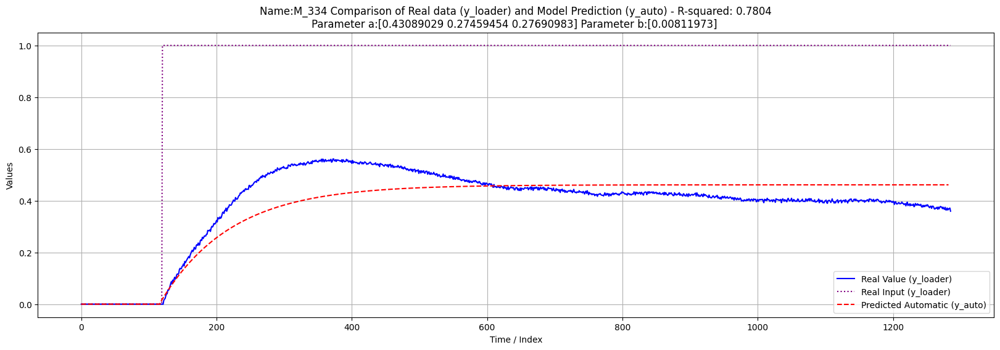

In [47]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_ccf
#Simulation best model structure
number_a=3
number_b=1
d=0
lags_v = 250

input = [M_334_df, M_343_df, WT_df, Unknown_df][0][['u_C1']].rename(columns={'u_C1': "u"}) #Select input column as DataFrame and rename
output = [M_334_df, M_343_df, WT_df, Unknown_df][0][['y_C1']].rename(columns={'y_C1': "y"}) #Select output column as DataFrame and rename
data = pd.concat([input,output], axis=1) #Concatenate along columns (axis=1)


# print the relative dataframe and check its columns
y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)

# Calculate the noise term (residuals)
noise = y_loader - y_auto  # Assuming 'y' is the actual output column in your 'data' DataFrame
print(noise)
# Autocorrelation of the noise
fig, ax = plt.subplots(figsize=(12, 4))
plot_acf(noise, lags=lags_v, ax=ax)  # Adjust 'lags' as needed
plt.title('Autocorrelation of Noise')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

# Partial Autocorrelation of the noise
fig, ax = plt.subplots(figsize=(12, 4))
plot_pacf(noise, lags=lags_v, ax=ax)  # Adjust 'lags' as needed
plt.title('Partial Autocorrelation of Noise')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

# Cross-correlation between input (u) and noise
fig, ax = plt.subplots(figsize=(12, 4))
plot_ccf(data['u'].values, noise, lags=lags_v, ax=ax)  # Adjust 'lags' as needed
plt.title('Cross-correlation between Input and Noise')
plt.xlabel('Lag')
plt.ylabel('Cross-correlation')
plt.show()






#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,y_loader.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title(f'Name:{code_name[0]} Comparison of Real data (y_loader) and Model Prediction (y_auto) - R-squared: {r_squared:.4f}\nParameter a:{parameters_a} Parameter b:{parameters_b} ')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()


Model with 3 a parameters, 1 b parameters and 0 time delay


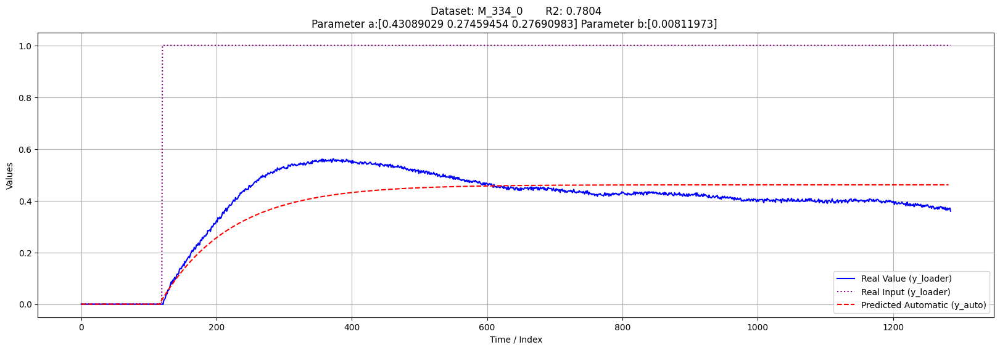


Model with 3 a parameters, 1 b parameters and 0 time delay


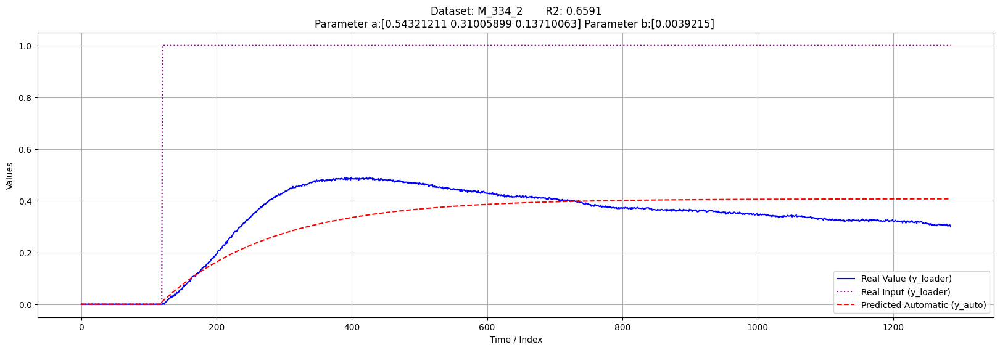


Model with 3 a parameters, 1 b parameters and 0 time delay


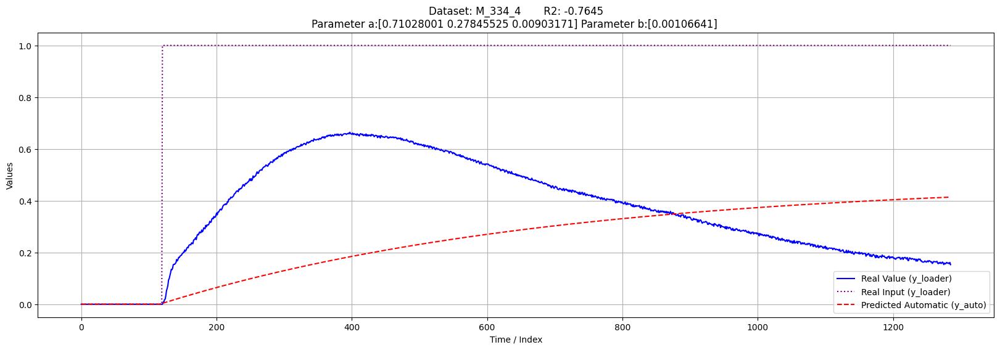


Model with 3 a parameters, 1 b parameters and 0 time delay


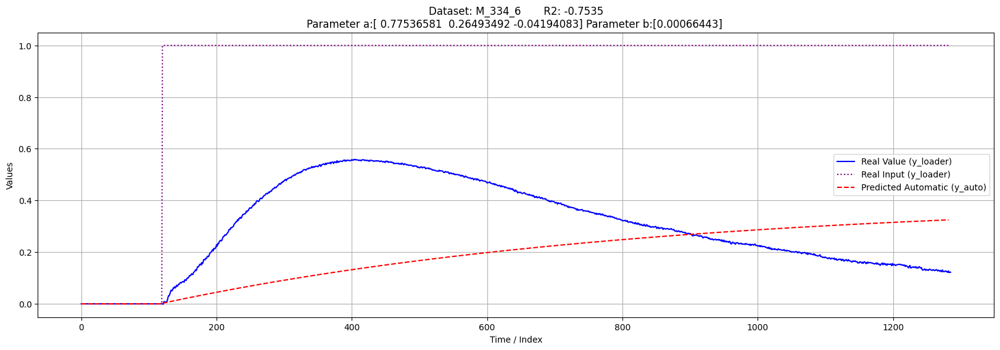


Model with 3 a parameters, 1 b parameters and 0 time delay


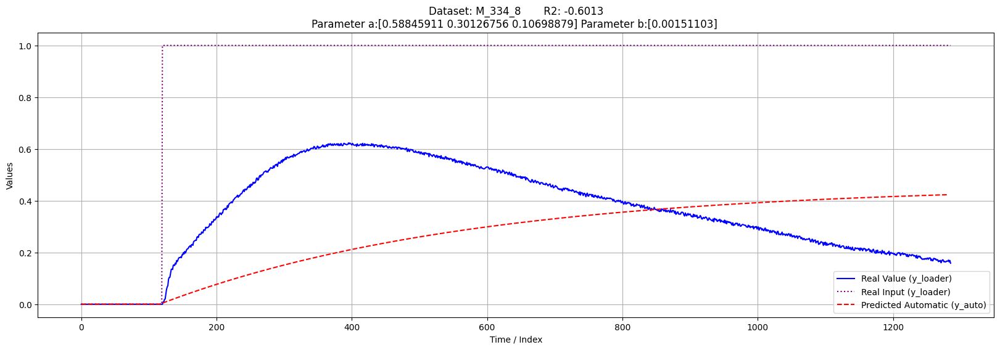


Model with 3 a parameters, 1 b parameters and 0 time delay


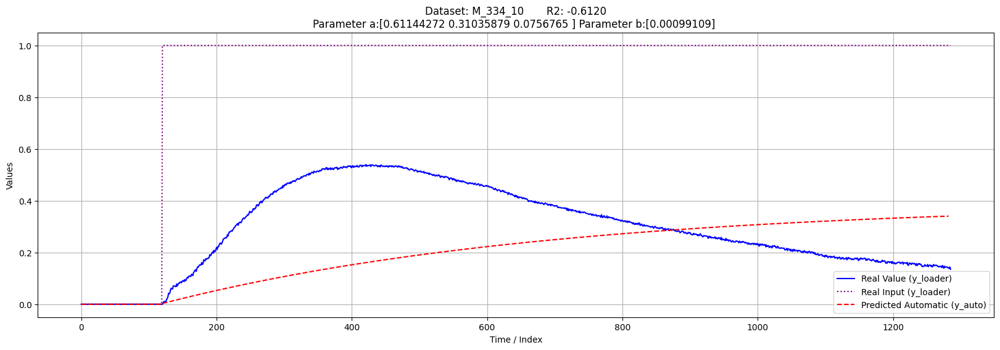


Model with 3 a parameters, 1 b parameters and 0 time delay


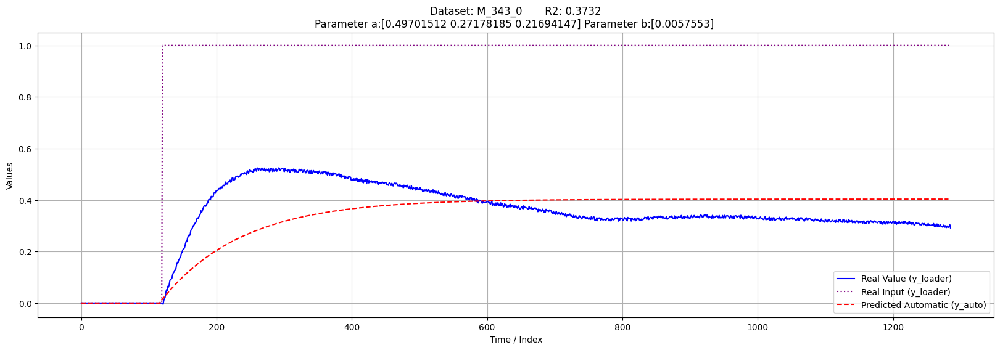


Model with 3 a parameters, 1 b parameters and 0 time delay


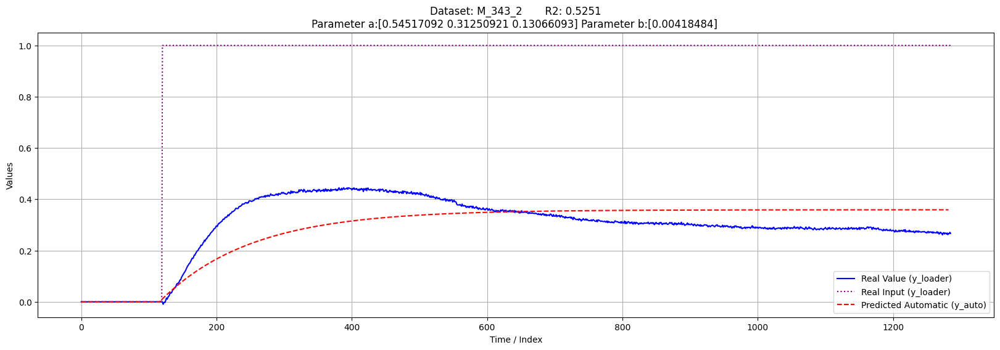


Model with 3 a parameters, 1 b parameters and 0 time delay


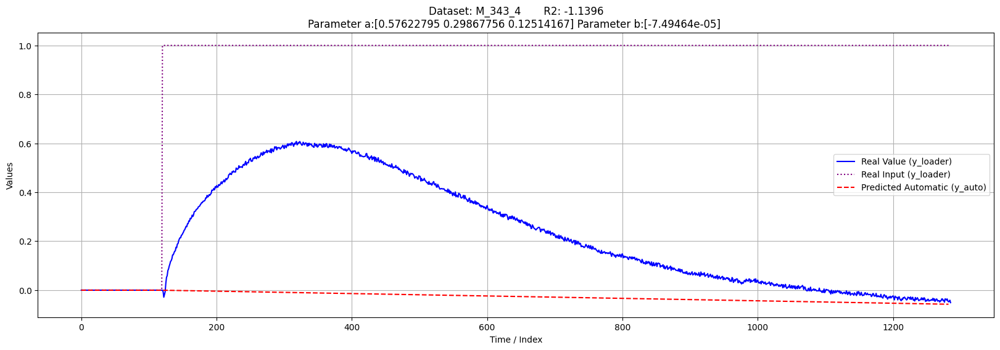


Model with 3 a parameters, 1 b parameters and 0 time delay


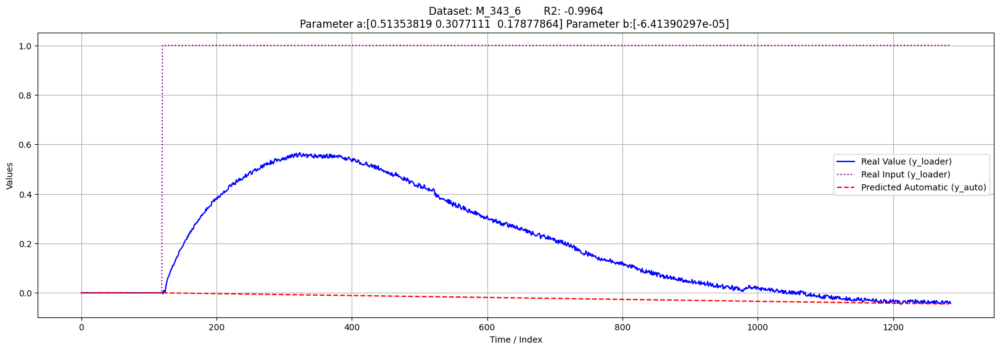


Model with 3 a parameters, 1 b parameters and 0 time delay


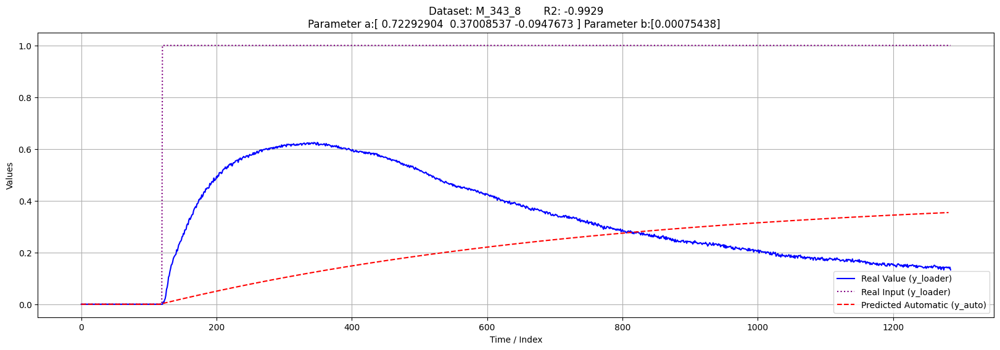


Model with 3 a parameters, 1 b parameters and 0 time delay


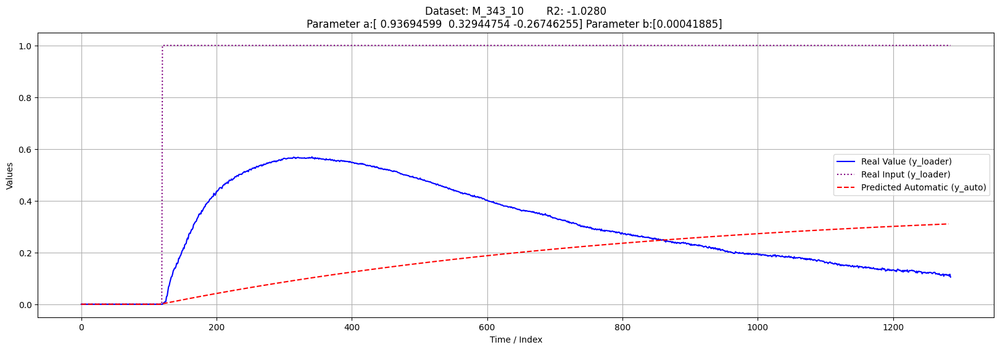


Model with 3 a parameters, 1 b parameters and 0 time delay


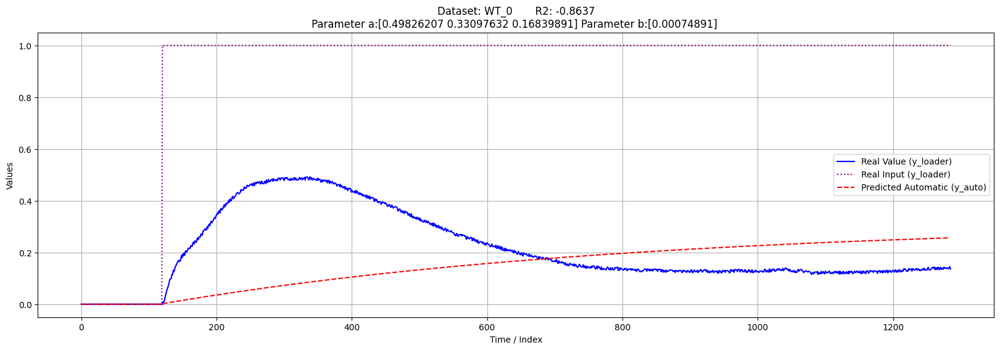


Model with 3 a parameters, 1 b parameters and 0 time delay


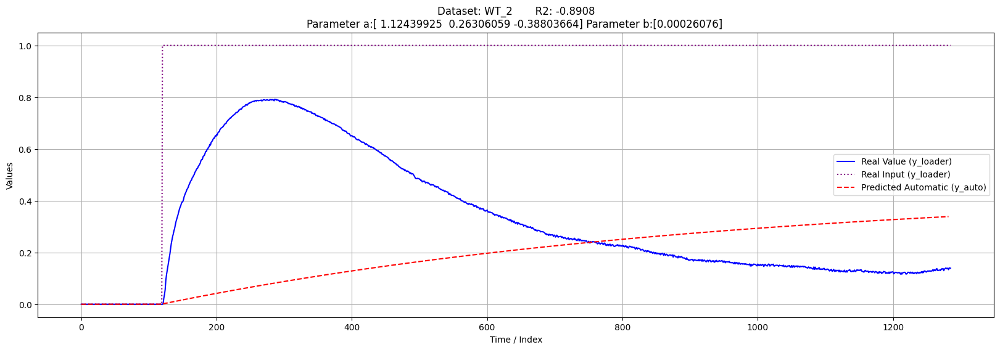


Model with 3 a parameters, 1 b parameters and 0 time delay


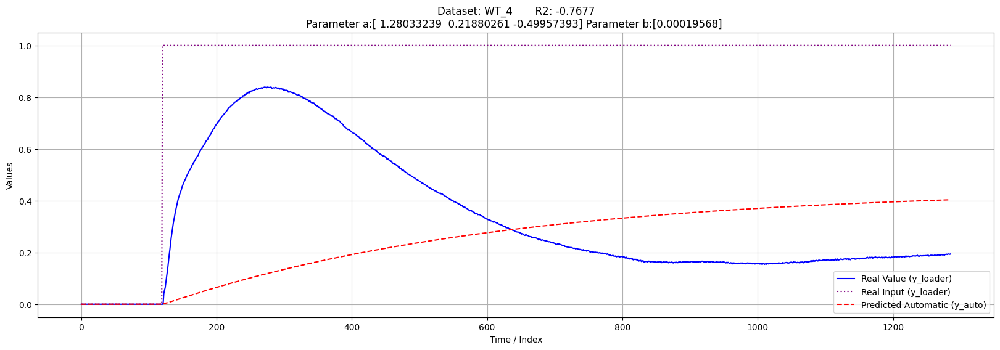


Model with 3 a parameters, 1 b parameters and 0 time delay


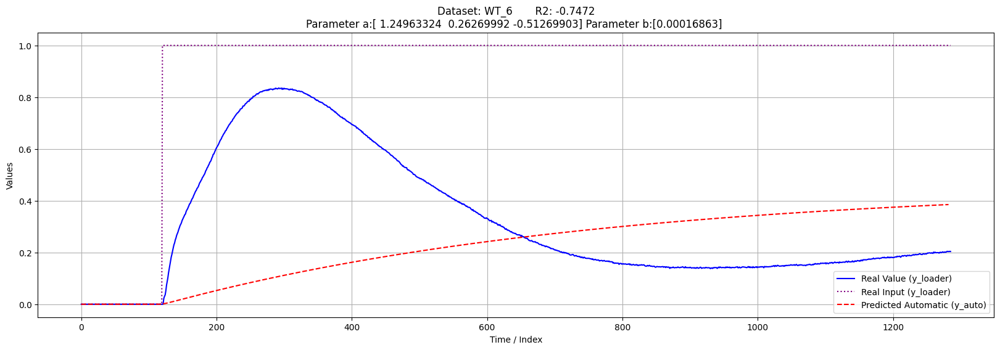


Model with 3 a parameters, 1 b parameters and 0 time delay


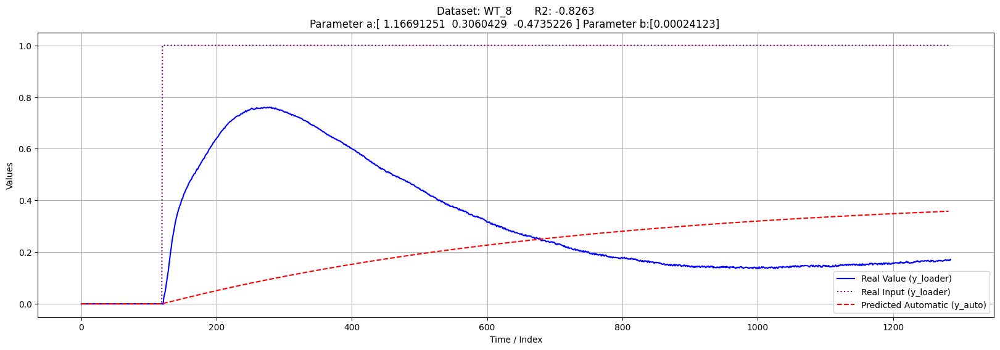


Model with 3 a parameters, 1 b parameters and 0 time delay


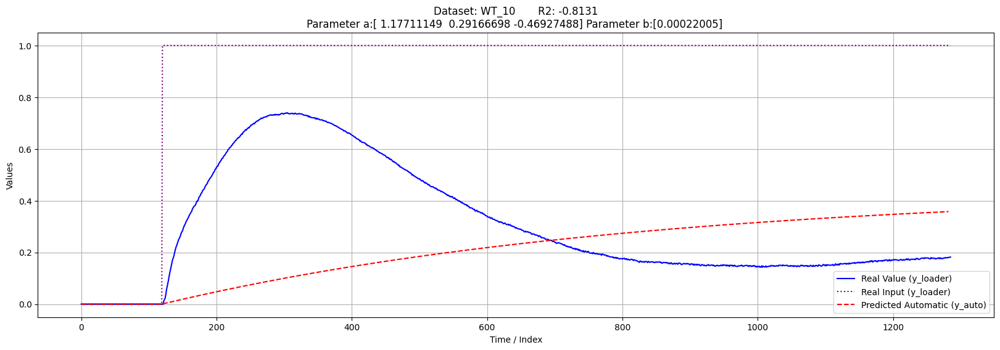


Model with 3 a parameters, 1 b parameters and 0 time delay


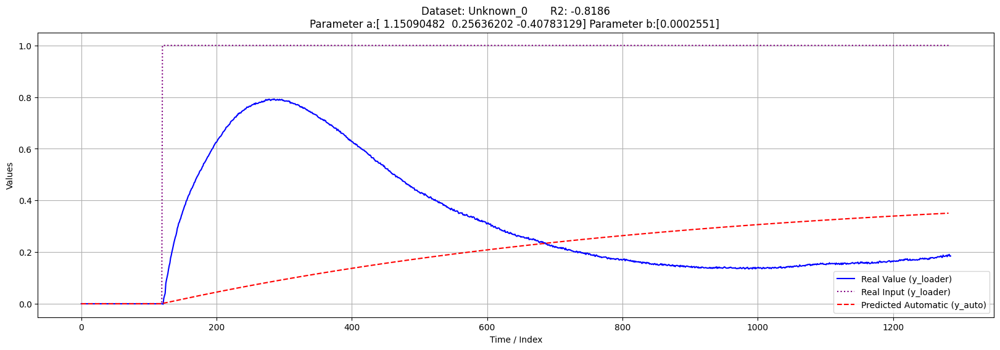


Model with 3 a parameters, 1 b parameters and 0 time delay


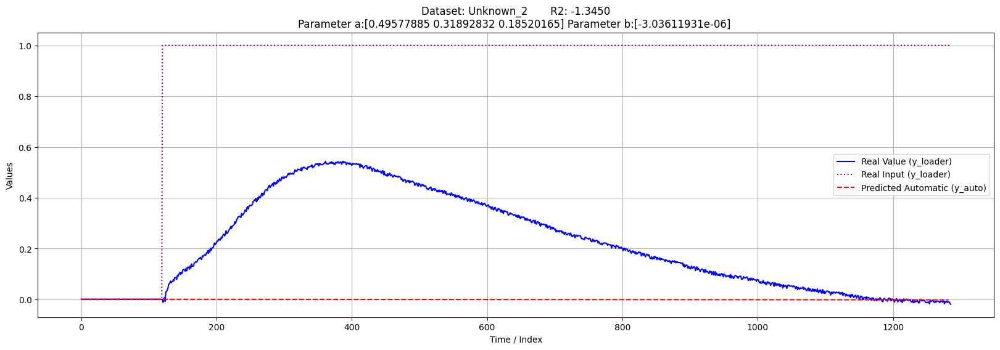

In [48]:
#Simulation All best model structures
number_a = 3
number_b = 1
d = 0

count = 0
for dataset in all_datasets_df:
  for i in range(0,len(dataset.columns),2):
    name_in = dataset.columns[i]
    name_out = dataset.columns[i+1]

    input = dataset[[name_in]].rename(columns={f'{name_in}': "u"}) #Select input column as DataFrame and rename
    output = dataset[[name_out]].rename(columns={name_out: "y"}) #Select output column as DataFrame and rename
    data = pd.concat([input, output], axis=1) #Concatenate along columns (axis=1)


    # print the relative dataframe and check its columns
    y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)

    print(ctl.TF(parameters_a,parameters_b))

    #Ploting
    plt.figure(figsize=(20, 6))
    X_axis = np.arange(0,y_loader.shape[0])
    # Plot the actual values (y_loader)
    plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
    plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
    # Plot the original data (y)    *AUTOMATIC
    plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

    # Add labels and title
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title(f'Dataset: {code_name[count]}_{i}       R2: {r_squared:.4f}\nParameter a:{parameters_a} Parameter b:{parameters_b} ') # Include R-squared in the title
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    # Adjust the y-axis limits if necessary for better visualization
    #plt.ylim([50, 200])
    plt.show()
  count += 1
#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?



In [50]:
ctl.TF(parameters_a,parameters_b)

NameError: name 'ctl' is not defined

In [ ]:
#Simulation best model structure
number_a=5
number_b=5
d=5

data = pd.concat([M_334_df['u_C6'].rename("u"), M_334_df['y_C6'].rename("y")], axis=1)
# print the relative dataframe and check its columns
y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)


#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,y_loader.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()

# Decompose ARX Modell
Every higher order system can be described as a combination of several first order systems.
* Serial coupling
* Parallel coupling
* Feedback coupling



How to find model:
1. Reducing the model order by polynomial division (only when m>n)
2. Decomposition into first order models


In [63]:

def decomposition_model(params_a, params_b): #params_a = den = n  ;   params_b = num = m
  m = len(params_b)
  n = len(params_a)

  #Step 1  -  Polynomial Division
  if m >= n:
    quotient, remainder = np.polydiv(params_a, params_b)
    print(f'Remainder: {remainder}  Quotient: {quotient}')
    params_c = remainder
  else:
    params_c = params_b
  #print(f'Order a:{len(params_a)}  b:{len(params_a)} c:{len(params_c)} ')

  #Step 2 - Decomposition in 1st Order (remainder/params_a)
  #2.a - All possible configurations:
  decompositions = {}
  A1 = params_a[0]
  A2 = params_a[1]
  B0 = params_c[0]
  B1 = params_c[1]

  # Serial Coupling
  a2_serial = quadratic_eq(1,-A1,A2)
  a1_serial = A2 - a2_serial
  b0_serial = params_c
  decompositions["serial"] = {
      "model1": {"a1": a1_serial, "b0": b0_serial},
      "model2": {"a2": a2_serial, },
  }
  #print(decompositions)
  # Parallel Coupling
  #TF1(k) + TF2(k) = B/A
  a2_parallel = quadratic_eq(1,-A1,A2)
  a1_parallel = A2 - a2_parallel
  b1_parallel = (B1 - (B0*a1_parallel)) / (a2_parallel - a1_parallel)
  b2_parallel = B0 - b1_parallel
  print(f'a1_parallel:{a1_parallel}\n a2_parallel:{a2_parallel}\n b1_parallel:{b1_parallel}\n b2_parallel:{b2_parallel}')
  decompositions["parallel"] = {
    "model1": {"a1": a1_parallel, "b1": b1_parallel},
    "model2": {"a2": a2_parallel, "b2": b2_parallel},
    }
  # Feedback Coupling
  # Assume feedback weights are proportional, solve for coefficients
  a2_feedback = B1 / B0 #if B0 != 0 else 0 # Avoid division by zero
  a1_feedback = (A2*a2_feedback)/(A1*a2_feedback - A2) #if (A1*a2_feedback - A2) != 0 else 0 # Avoid division by zero
  b1_feedback = (a1_feedback*a2_feedback*B0)/A2 #if A2 != 0 else 0
  b2_feedback = (a2_feedback/B1) - (1/b1_feedback)#if B1 != 0 and b1_feedback != 0 else 0 # Avoid division by zero
  decompositions["feedback"] = {
      "model1": {"a1": a1_feedback, "b1": b1_feedback},
      "model2": {"a2": a2_feedback, "b2": b2_feedback},
    }

  #return decompositions

  #2.b - All possible configurations:
  #Real Values ????
  #if value == "inf":
    #decompositions[key] = "inf"
    #pass

  #Step 3
    # Step 3 - Filter unstable models
  for key, value in list(decompositions.items()):  # Iterate over a copy to allow deletion
      for model_key, model_value in list(value.items()):  # Iterate over a copy to allow deletion
          for param_key, param_value in model_value.items():
                # Check if the parameter value is a sequence (tuple, list, array)
              if isinstance(param_value, (tuple, list, np.ndarray)):
                  # Check if any element in the sequence has an absolute value greater than 1
                  if np.any(np.abs(param_value) > 1):
                      # Remove the unstable model from the dictionary
                      del decompositions[key][model_key]
                      break  # Break out of the inner loop since the model is unstable
              # Check if the parameter value is a single number and its absolute value is greater than 1
              elif abs(param_value) > 1:
                  # Remove the unstable model from the dictionary
                  del decompositions[key][model_key]
                  break  # Break out of the inner loop since the model is unstable


  #Step 4

'''for index, model in best_models_df.iterrows():
  A = model.loc['Parameters_a']
  B = model.loc['Parameters_b']
  print(f'\n\nModel: {model.loc["Code_Name"]} \nParameter "A": {A}\nParameters "B": {B}')

  print(decomposition_model(A,B))'''

p_b = np.array([0.0004, 0.0331, -0.0501, 0.0185])
p_a = np.array([1,-1.5110, 0.5708])
decomposition_model(p_a,p_b)


'''for dataset in all_datasets_df:
  for i in range(0,len(dataset.columns),2):
    name_in = dataset.columns[i]
    name_out = dataset.columns[i+1]
    input = dataset[[name_in]].rename(columns={f'{name_in}': "u"}) #Select input column as DataFrame and rename
    output = dataset[[name_out]].rename(columns={name_out: "y"}) #Select output column as DataFrame and rename
    data = pd.concat([input, output], axis=1) #Concatenate along columns (axis=1)

    # print the relative dataframe and check its columns
    y_loader, y_auto, A, B, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, 2, 3, d)

    decomposition_model(A,B)'''
'''

  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den1 =  np.insert(-parameters_a, 0, 1)
  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)
  TF = ctrl.TransferFunction(num, den)    #define transfer function

if num_b >= num_a:
  #Polynomial Division
  #remander*(C/A) -> step 2(decomposion in 1st order models) (2a->two 1st order,2b->Real values)
  #Quociente -> step 4()
  B/A = Quociente + remander*(C/A)

'''

Remainder: [ 1.     -1.511   0.5708]  Quotient: [0.]
a1_parallel:[-3.33802675 -0.68397325]
 a2_parallel:(1.8270267518026906, -0.8270267518026906)
 b1_parallel:[0.35372852 5.7812408 ]
 b2_parallel:[ 0.64627148 -4.7812408 ]


<ipython-input-63-171a70e5dfc6>:45: RuntimeWarning: divide by zero encountered in scalar divide
  a1_feedback = (A2*a2_feedback)/(A1*a2_feedback - A2) #if (A1*a2_feedback - A2) != 0 else 0 # Avoid division by zero


'\n\n  num = parameters_b # b [b1,b2,b3,...] (exogenous)\n  den1 =  np.insert(-parameters_a, 0, 1)\n  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)\n  TF = ctrl.TransferFunction(num, den)    #define transfer function\n\nif num_b >= num_a:\n  #Polynomial Division\n  #remander*(C/A) -> step 2(decomposion in 1st order models) (2a->two 1st order,2b->Real values)\n  #Quociente -> step 4()\n  B/A = Quociente + remander*(C/A)\n\n'

In [52]:
for index, model in best_models_df.iterrows():
  print(model.loc['Parameters_a'])
ctrl.TransferFunction(remainder, denominator_coeffs)

[0.43089029 0.27459454 0.27690983]
[0.59706396 0.39427608]
[0.99821072]
[0.76649792 0.23189993]
[0.9976754]
[0.99816839]
[0.49653106 0.27114756 0.21764514]
[0.59695075 0.39256574]
[0.62079194 0.37904268]
[0.58716922 0.41275178]
[0.99870282]
[0.99877788]
[0.99798717]
[ 1.17233109 -0.17260456]
[0.99931573]
[0.99916992]
[0.99952625]
[ 1.15699304  0.30709025 -0.46436813]
[ 1.25566476 -0.2564021 ]
[0.49577478 0.31892302 0.18519253]


TransferFunction(array([0.]), array([1.]))

In [51]:
'''import numpy as np
import control as ctrl
from scipy.signal import residue

# Example high-order ARX model: H(s) = N(s) / D(s)
# Replace these coefficients with your model's values.
numerator_coeffs = [1, 5, 10, 2]  # N(s)
denominator_coeffs = [1, 0.53942869,  0.3563705,   0.22820434,  0.00996958, -0.14209953]

#Real Simulation
numerator_coeffs = best_models_df.iloc[0]['Parameters_a']
denominator_coeffs  = best_models_df.iloc[0]['Parameters_b']



# Create the transfer function
H = ctrl.TransferFunction(numerator_coeffs, denominator_coeffs)
print("Original Transfer Function:")
print(H)

# Step 1: Reduce model order (only when m > n)
if len(numerator_coeffs) > len(denominator_coeffs):
    quotient, remainder = np.polydiv(numerator_coeffs, denominator_coeffs)
    reduced_model = ctrl.TransferFunction(remainder, denominator_coeffs)
    print("\nReduced Model (Order Reduction):")
    print(reduced_model)
else:
    reduced_model = H
    print("\nNo reduction needed (m <= n).")

# Step 2: Decompose into first-order models
# Perform partial fraction decomposition
num = reduced_model.num[0][0]  # Numerator coefficients
den = reduced_model.den[0][0]  # Denominator coefficients
residues, poles, constant = residue(num, den)

print("\nPartial Fraction Decomposition:")
for i in range(len(residues)):
    print(f"R{i+1}: {residues[i]}, Pole: {poles[i]}")

# Step 3: Remove unstable configurations
stable_residues = []
stable_poles = []
for r, p in zip(residues, poles):
    if np.real(p) < 0:  # For continuous-time systems
        stable_residues.append(r)
        stable_poles.append(p)

# Recompose stable transfer function
stable_model = sum(
    ctrl.TransferFunction([r], [1, -p]) for r, p in zip(stable_residues, stable_poles)
)
print("\nStable Model:")
print(stable_model)

# Step 4: Interpret the model structure
print("\nModel Structure Interpretation:")
print(f"Number of Poles: {len(poles)}")
print(f"Stable Poles: {stable_poles}")
print(f"System Dynamics: This is a stable system with {len(stable_poles)} dominant dynamics.")

# Optionally plot
import matplotlib.pyplot as plt

draw_coupling_diagram("series", poles, stable_residues)
draw_coupling_diagram("parallel", poles, stable_residues)
draw_coupling_diagram("feedback", poles, stable_residues)

plt.figure()
ctrl.bode_plot(stable_model, dB=True)
plt.suptitle("Bode Plot of the Stable Model")
plt.show()'''


Original Transfer Function:
<TransferFunction>: sys[4006]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


0.4309 s^2 + 0.2746 s + 0.2769
------------------------------
           0.00812


Reduced Model (Order Reduction):
<TransferFunction>: sys[4007]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


0
-
1


Partial Fraction Decomposition:

Stable Model:
0

Model Structure Interpretation:
Number of Poles: 0
Stable Poles: []
System Dynamics: This is a stable system with 0 dominant dynamics.


NameError: name 'draw_coupling_diagram' is not defined

In [ ]:
import networkx as nx
def draw_coupling_diagram(coupling_type, poles, residues):
    """
    Visualize the system as a block diagram for a given coupling type.

    Parameters:
    - coupling_type: str ("series", "parallel", or "feedback")
    - poles: List of poles
    - residues: List of residues
    """
    G = nx.DiGraph()

    # Nodes for each subsystem
    for i, (p, r) in enumerate(zip(poles, residues), 1):
        G.add_node(f"Subsystem {i}\nPole: {p:.2f}\nResidue: {r:.2f}")

    # Define connections based on coupling type
    if coupling_type == "series":
        edges = [(f"Subsystem {i}", f"Subsystem {i+1}") for i in range(1, len(poles))]
    elif coupling_type == "parallel":
        edges = [("Input", f"Subsystem {i}") for i in range(1, len(poles) + 1)]
        edges += [(f"Subsystem {i}", "Output") for i in range(1, len(poles) + 1)]
        G.add_node("Input")
        G.add_node("Output")
    elif coupling_type == "feedback":
        edges = [("Input", "Subsystem 1")]
        edges += [(f"Subsystem {i}", f"Subsystem {i+1}") for i in range(1, len(poles))]
        edges += [(f"Subsystem {len(poles)}", "Input")]

    # Add edges
    G.add_edges_from(edges)

    # Draw the graph
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G) if coupling_type != "parallel" else nx.shell_layout(G)
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=3000,
        node_color="lightblue",
        font_size=10,
        font_weight="bold",
        edge_color="gray",
    )
    plt.title(f"{coupling_type.capitalize()} Coupling Diagram", fontsize=14)
    plt.show()

# Example poles and residues (replace with real values from decomposition)
poles = [-1, -2, -3]
residues = [0.5, 0.3, 0.2]

# Visualize each coupling type
draw_coupling_diagram("series", poles, residues)
draw_coupling_diagram("parallel", poles, residues)
draw_coupling_diagram("feedback", poles, residues)

In [ ]:
#Using NumPy’s polydiv Function
A = [2, 4, -6, 8]
B = [1, 0, 3]

quotient, remainder = np.polydiv(A, B)

print(f"\nUsing NumPy’s polydiv Function\nQuotient: {quotient}\nRemainder: {remainder}\n")

#Using SymPy’s div Function
from sympy import symbols, div
x = symbols('x')
A = 2*x**3 + 4*x**2 - 6*x + 8
B = x**2 + 3

quotient, remainder = div(A, B, domain='QQ')

print(f"\nUsing SymPy’s div Function\nQuotient: {quotient}\nRemainder: {remainder}\n")

#Manual Polynomial Long Division
def poly_long_div(dividend, divisor):
    quotient = []
    while len(dividend) >= len(divisor):
        lead_coeff = dividend[0] / divisor[0]
        quotient.append(lead_coeff)
        dividend = [coeff - lead_coeff * div_coeff for coeff, div_coeff in zip(dividend, divisor + [0]*(len(dividend)-len(divisor)))]
        dividend.pop(0)
    return quotient, dividend

A = [2, 4, -6, 8]
B = [1, 0, 3]
quotient, remainder = poly_long_div(A, B)
print(f"\nManual Polynomial Long Division\nQuotient: {quotient}\nRemainder: {remainder}\n")

In [ ]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    u = data['u']
    X = pd.DataFrame()
    y = data['y']


    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)
    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)


    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y